# Packages

In [1]:
import matplotlib_inline.backend_inline as backend_inline
import IPython.display as disp
# Make set_matplotlib_formats available where Scanpy expects it
disp.set_matplotlib_formats = backend_inline.set_matplotlib_formats

import numpy as np                                # scientific computing toolkit
import pandas as pd                               # data analysis toolkit
import scanpy as sc                               # scanpy is referred to with sc.***
import matplotlib.pyplot as plt                   # Matplotlib is referred to with plt.***
from scipy import stats                           # for linear regressions
import seaborn as sns                             # for easy heatmaps
import scirpy as ir                               # TCR analysis
import scvelo as scv
#import mudata as md                               # New data structure 
#from mudata import MuData

sc.settings.verbosity = 3                         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()                         # check if all needed versions are installed and up to date (old: print_Versions(), changed in new version of scanpy)
results_directory = './Analysis_output/'
results_file = results_directory + '/results_file/write/results.h5ad'             # the file that will store the analysis results

| Package           | Version |
| ----------------- | ------- |
| matplotlib-inline | 0.1.7   |
| numpy             | 2.1.3   |
| pandas            | 2.2.3   |
| scanpy            | 1.11.0  |
| matplotlib        | 3.10.1  |
| scipy             | 1.15.2  |
| seaborn           | 0.13.2  |
| scirpy            | 0.12.2  |
| scvelo            | 0.3.3   |

| Dependency            | Version           |
| --------------------- | ----------------- |
| leidenalg             | 0.10.2            |
| charset-normalizer    | 3.4.1             |
| prompt_toolkit        | 3.0.50            |
| six                   | 1.17.0            |
| ipython               | 9.0.2             |
| pillow                | 11.1.0            |
| yamlordereddictloader | 0.4.2             |
| natsort               | 8.4.0             |
| setuptools            | 75.8.2            |
| python-dateutil       | 2.9.0.post0       |
| adjustText            | 1.3.0             |
| tqdm                  | 4.67.1            |
| parasail              | 1.3.4             |
| pytz                  | 2025.1            |
| rich                  | 13.9.4            |
| zipp                  | 3.21.0            |
| packaging             | 24.2              |
| decorator             | 5.2.1             |
| texttable             | 1.7.0             |
| defusedxml            | 0.7.1             |
| cycler                | 0.12.1            |
| executing             | 2.2.0             |
| scikit-learn          | 1.5.2             |
| stack-data            | 0.6.3             |
| session-info2         | 0.1.2             |
| Pygments              | 2.19.1            |
| pycairo               | 1.27.0            |
| awkward_cpp           | 44                |
| airr                  | 1.5.1             |
| asttokens             | 3.0.0             |
| numba                 | 0.61.0            |
| statsmodels           | 0.14.4            |
| llvmlite              | 0.44.0            |
| wcwidth               | 0.2.13            |
| joblib                | 1.4.2             |
| parso                 | 0.8.4             |
| igraph                | 0.11.8            |
| jedi                  | 0.19.2            |
| pyparsing             | 3.2.1             |
| more-itertools        | 10.3.0            |
| pyzmq                 | 26.2.1            |
| jupyter_core          | 5.7.2             |
| h5py                  | 3.13.0            |
| patsy                 | 1.0.1             |
| torch                 | 2.6.0 (2.6.0+cpu) |
| jaraco.text           | 3.12.1            |
| jaraco.context        | 5.3.0             |
| awkward               | 2.7.4             |
| kiwisolver            | 1.4.8             |
| attrs                 | 25.1.0            |
| colorama              | 0.4.6             |
| debugpy               | 1.8.12            |
| PyYAML                | 6.0.2             |
| jaraco.collections    | 5.1.0             |
| comm                  | 0.2.2             |
| psutil                | 7.0.0             |
| importlib_metadata    | 8.6.1             |
| ipywidgets            | 8.1.5             |
| jaraco.functools      | 4.0.1             |
| jupyter_client        | 8.6.3             |
| networkx              | 3.4.2             |
| fsspec                | 2025.2.0          |
| pywin32               | 308               |
| Cython                | 3.0.12            |
| threadpoolctl         | 3.5.0             |
| tornado               | 6.4.2             |
| typing_extensions     | 4.12.2            |
| platformdirs          | 4.3.6             |
| anndata               | 0.11.3            |
| traitlets             | 5.14.3            |
| Levenshtein           | 0.27.1            |
| legacy-api-wrap       | 1.4.1             |
| setuptools-scm        | 8.2.0             |
| ipykernel             | 6.29.5            |
| RapidFuzz             | 3.12.2            |
| pure_eval             | 0.2.3             |

| Component | Info                                                                                          |
| --------- | --------------------------------------------------------------------------------------------- |
| Python    | 3.11.11 | packaged by conda-forge | (main, Dec  5 2024, 14:06:23) [MSC v.1942 64 bit (AMD64)] |
| OS        | Windows-10-10.0.26100-SP0                                                                     |
| CPU       | 16 logical CPU cores, AMD64 Family 25 Model 116 Stepping 1, AuthenticAMD                      |
| GPU       | No GPU found                                                                                  |
| Updated   | 2025-04-03 09:10                                                                              |

## Directory variables

In [2]:
import glob
import os
from pathlib import Path

sample_directory = './GEX_VDJ/'
analysis_info = './analysis_info/'
adata_directory = './analysis_output/IMMUN_COM/annotated_files/'

In [3]:
plt.rcParams['figure.figsize']=(6,6) #rescale figures
sc.set_figure_params(dpi=100, dpi_save=400, color_map='viridis', vector_friendly=True, format='eps', ipython_format = 'png2x')
### you can set a default figure directory here for saving output
sc.settings.figdir = "./analysis_output/IMMUN_COM/"
## Figure directory for matplotlib figures/axes
save_figure_sc = "./analysis_output/IMMUN_COM/"
#Use
#plt.savefig(save_figure + 'image.pdf')
save_figure_ir = "./analysis_output/IMMUN_COM/"
#csv directory
read_csv = './analysis_output/IMMUN_COM/'
save_csv = r'./analysis_output/IMMUN_COM/'

## Load data

In [4]:
adata = sc.read(adata_directory + 'adata_dpmult_batch_updated.h5ad')

### Clustering

In [5]:
from sklearn.metrics import silhouette_score
def titrate_leiden_resolution(adata):
    res_array=list(np.round(np.linspace(.2, 1, 10),1))
    silhoutte_list=list()
    sc.settings.verbosity = 1
    for i,res in enumerate(res_array):
        sc.tl.leiden(adata, resolution=res)
        if adata.obs.leiden.unique().shape[0]>2:
            silhoutte_list.append(silhouette_score(adata.obsm['X_umap'],
                    adata.obs[f'leiden'],
                    metric='euclidean'))
        else:
            silhoutte_list.append(np.nan)
        print(str(np.round(((i+1)/len(res_array))*100,1))+"%", end="\r", flush=True)
    sns.lineplot(x=res_array, y=silhoutte_list, color='black', markers='o')

100.0%

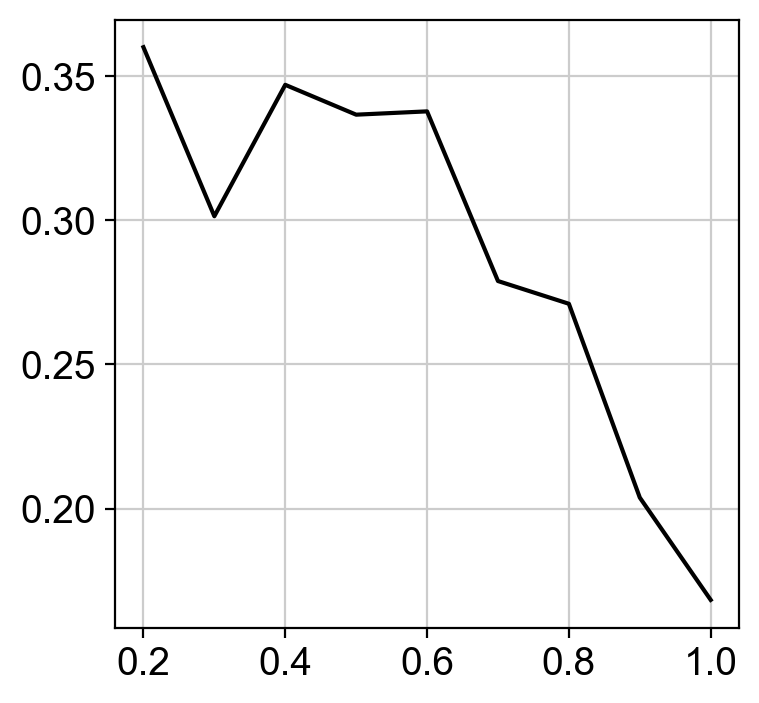

In [6]:
titrate_leiden_resolution(adata)

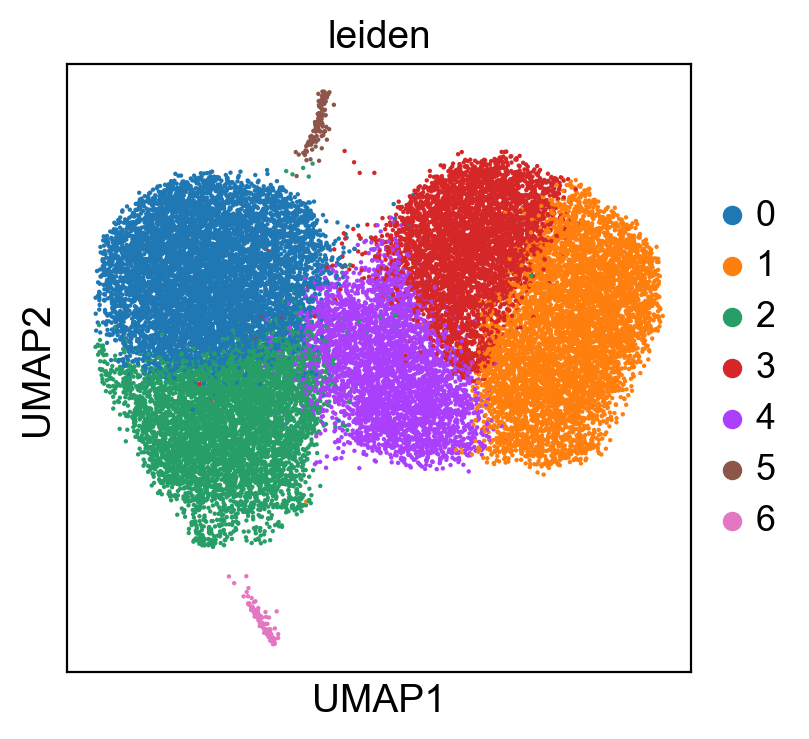

In [7]:
sc.tl.leiden(adata, resolution = 0.4)
sc.pl.umap(adata, color='leiden', s=10)

Get genes and clusters from Abdullah et al

In [8]:
gene_df  = pd.read_csv(read_csv + 'adbullah_seurat.csv')
gene_df = gene_df[gene_df.avg_log2FC>0]
gene_sets = gene_df.groupby('cluster')['Gene name'].apply(list).to_dict()

In [9]:
# For each cluster signature, compute a score and store it in adata.obs
for cluster, gene_list in gene_sets.items():
    print(len(gene_list))
    score_name = f'score_cluster_{cluster}'
    sc.tl.score_genes(adata, gene_list[:15], score_name=score_name)

37
89
19
461
689
371
167


In [10]:
sns_cmap = sns.color_palette('light:mediumblue', as_cmap = True)
#sns_cmap = sns.color_palette('light:slateblue', as_cmap = True)
#sns_cmap = sns.color_palette('light:darkslateblue', as_cmap = True)

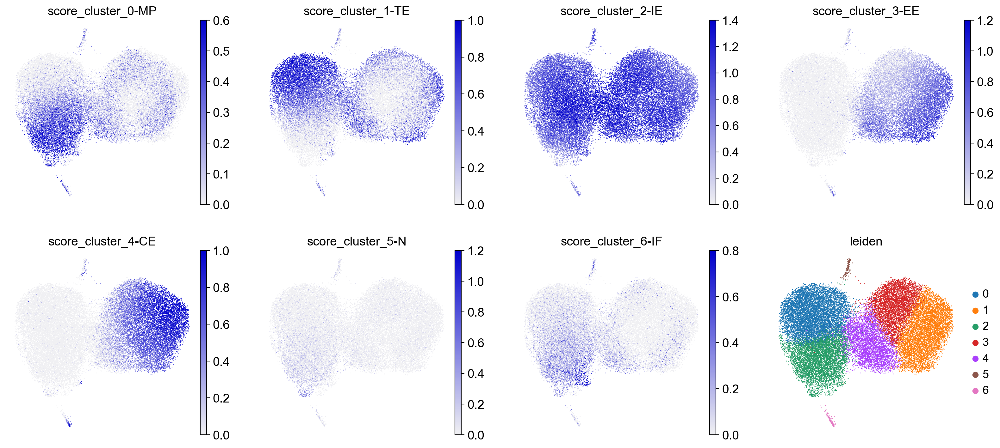

In [11]:
# Create a list of score column names
score_cols = [f'score_cluster_{cluster}' for cluster in gene_sets.keys()]
sc.pl.umap(adata, color=score_cols + ['leiden'], cmap = sns_cmap, vmin = 0, vmax = [0.6, 1, 1.4, 1.2, 1, 1.2, 0.8], frameon=False)

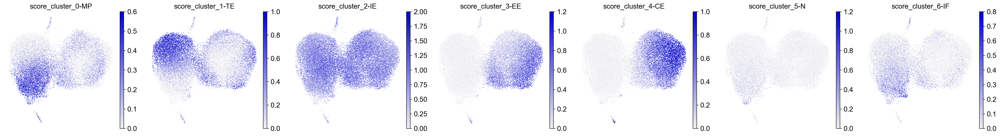

In [12]:
score_cols = [f'score_cluster_{cluster}' for cluster in gene_sets.keys()]
sns_cmap = sns.color_palette('light:mediumblue', as_cmap = True)
v_max_list = [0.6, 1, 2, 1.2, 1, 1.2, 0.8]

ncols = len(score_cols)
fig, ax = plt.subplots(figsize = (4*ncols,4), ncols = ncols)

for i, score in enumerate(score_cols):
    sc.pl.umap(adata, color=score, cmap = sns_cmap, vmin = 0, vmax = v_max_list[i], frameon=False,
              show = False, ax=ax[i])

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_all_score_umaps.eps')
    

## Phenotype UMAPs

In [13]:
phenotype_list = ['Zeb2','Cx3cr1','Cxcr3','Il7r','Tcf7']

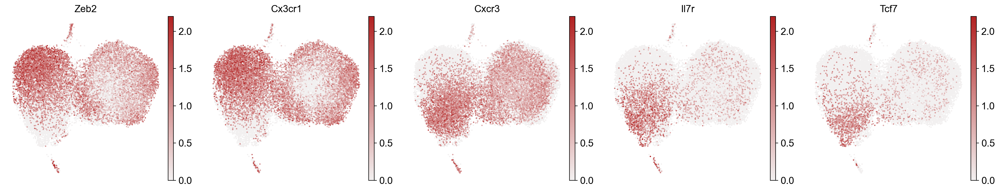

In [14]:
ncols = len(phenotype_list)
fig, ax = plt.subplots(figsize = (4*ncols,4), ncols = ncols)
sns_cmap = sns.color_palette('light:firebrick', as_cmap = True)
v_max_list = [2.2, 2.2, 2.2, 2.2, 2.2]

for i, gene in enumerate(phenotype_list):
    sc.pl.umap(adata, color = gene, cmap = sns_cmap, vmin=0, vmax=v_max_list[i], s = 15, frameon=False, show=False, ax=ax[i])
    
fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_all_phenotype_genes_umaps.eps')

# Selected UMAPS

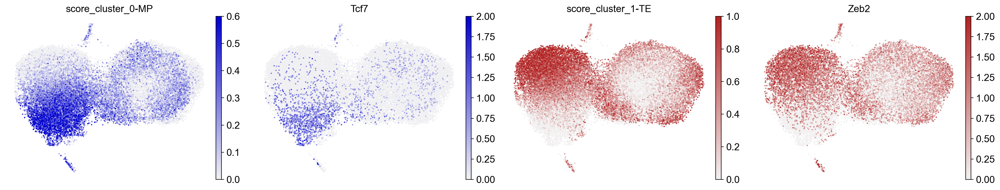

In [15]:
blue_cmap = sns.color_palette('light:mediumblue', as_cmap = True)
red_cmap = sns.color_palette('light:firebrick', as_cmap = True)


plot_list = ['score_cluster_0-MP','Tcf7','score_cluster_1-TE','Zeb2']
plot_color = [blue_cmap,blue_cmap,red_cmap,red_cmap]
v_max_list = [0.6,2.0,1.0,2.0]

ncols = 4
fig, ax = plt.subplots(figsize = (5*ncols,4), ncols = ncols)

for i, gex in enumerate(plot_list):
    sc.pl.umap(adata, color = gex, cmap = plot_color[i], vmin=0, vmax=v_max_list[i], s = 15, frameon=False, show=False, ax=ax[i])

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_selected_umaps.eps')


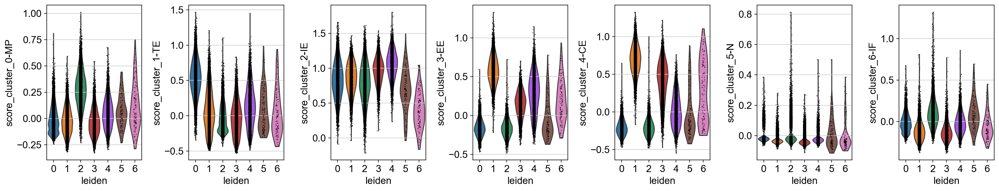

In [16]:
score_cols = [f'score_cluster_{cluster}' for cluster in gene_sets.keys()]

fig, ax = plt.subplots(ncols = len(score_cols), figsize = (20,4)) 

for i, score in enumerate(score_cols):
    sc.pl.violin(
    adata, 
        keys=score, 
        groupby='leiden', 
        jitter=True,         # add some jitter for better visualization of individual points
        stripplot=True,      # optionally overlay a strip plot of the data points
        show=False,
        ax=ax[i]
    )

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_score_dis_dpmult.eps')


HVGs

In [17]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', layer = 'log1p_norm')

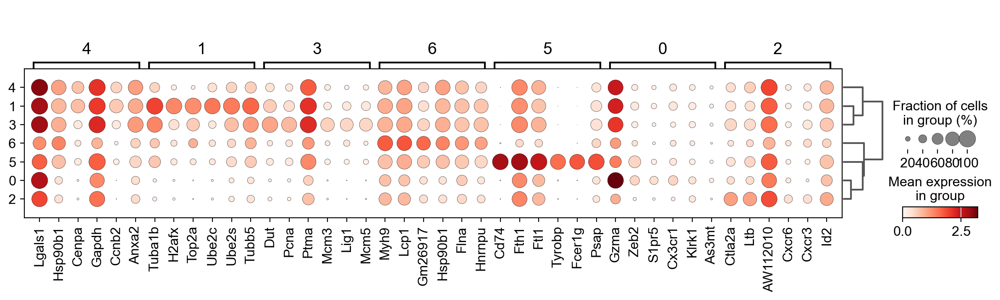

In [18]:
fig, ax = plt.subplots(figsize = (12,3.8))

sc.pl.rank_genes_groups_dotplot(adata, n_genes=6, show=False,
                               ax = ax)

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_deg_groups_dpmult.eps')

### Annotate leiden/phenotype

In [19]:
# Define your mapping from old cluster labels to new names.
new_labels = {
    '0': '0_TE',
    '1': '1_EE_like',
    '2': '2_MP',
    '3': '3_CE',
    '4': '4_IE_like',
    '5': '5_na1',
    '6': '6_na2'
}
color_palette = ["#4477AA", "#66CCEE", "#228833", "#CCBB44", "#EE6677", "#AA3377", "#BBBBBB"]
# Rename the categories in place.
adata.obs['leiden'] = adata.obs['leiden'].cat.rename_categories(new_labels)

Color dict for leiden

In [20]:
leiden_dict = {
    '2_MP': "#4477AA",    # dark blue
    '3_CE': "#66CCEE",    # light blue
    '0_TE': "#EE6677",    # pink/red
    '4_IE_like': "#228833", # green
    '1_EE_like': "#CCBB44", # yellow
    '5_na1': "#eeeeee",    # gray
    '6_na2': "#eeeeee"     # gray
}

clusters = sorted(adata.obs['leiden'].unique(), key=lambda x: int(x.split('_')[0]))
adata.uns['leiden_colors'] = [leiden_dict[cl] for cl in clusters]

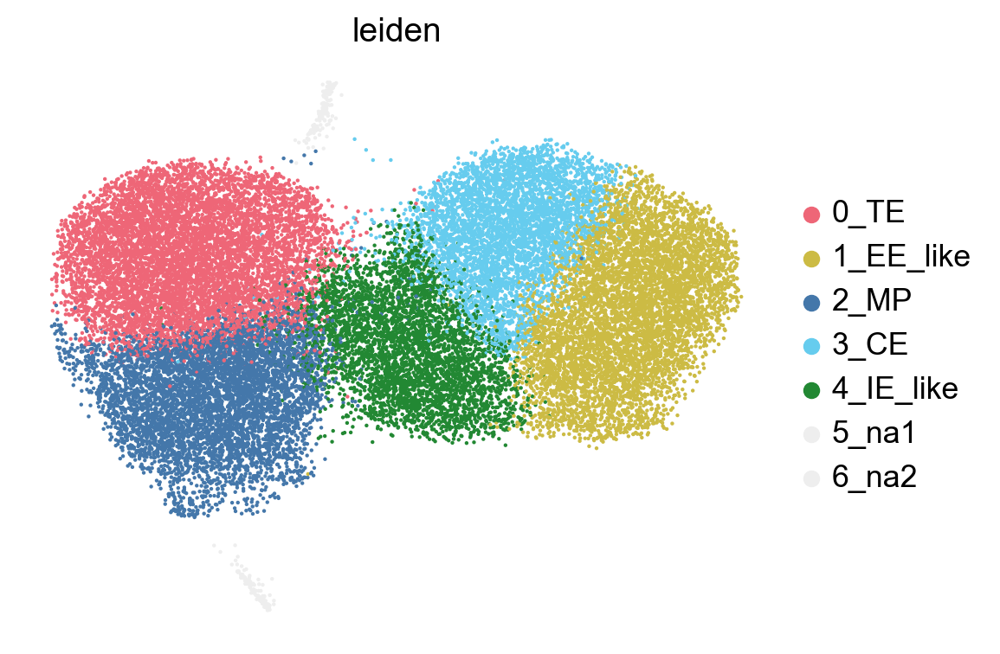

In [21]:
fig, ax = plt.subplots(figsize = (6,4))

#color_palette = ["#4477AA", "#66CCEE", "#228833", "#CCBB44", "#EE6677", "#AA3377", "#BBBBBB"]
sc.pl.umap(adata, color='leiden', s=10, show = False, ax=ax, frameon = False)

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_selected_leiden_dp_mult.eps')

### Marker genes

In [22]:
marker_dict = {
    'effector': ['Cx3cr1', 'Klre1', 'Klrg1', 'Zeb2', 'Prf1', 'Gzma', 'Gzmb', 'Lgals1'],
    'proliferation': ['Top2a', 'Mki67', 'Stmn1', 'Cdk1', 'Birc5'],
    'cytoskeleton_ecm': ['Anax2', 'S100a4', 'Vim', 'Lgals3'],
    'ifn_responsive': ['Oas3', 'Irf7', 'Stat1', 'Bst2', 'Ifit1', 'Isg15'],
    'memory': ['Slamf6', 'Il7r', 'Cxcr3', 'Ltb', 'Gpr183'],
    'naive_survival': ['Tcf7', 'Bcl2', 'Lef1', 'Ccr7', 'Sell']
}

In [23]:
marker_dict = {
    'effector': ['Cx3cr1', 'Klre1', 'Zeb2', 'Gzma', 'Gzmb', 'Lgals1'],
    'proliferation': ['Top2a', 'Mki67', 'Stmn1', 'Cdk1', 'Birc5'],
    'cytoskeleton_ecm': ['Vim', 'Lgals3'],
    'ifn_responsive': ['Oas3', 'Irf7', 'Stat1', 'Bst2', 'Ifit1', 'Isg15'],
    'memory': ['Slamf6', 'Il7r', 'Cxcr3', 'Ltb', 'Gpr183'],
    'naive_survival': ['Tcf7', 'Bcl2', 'Ccr7', 'Sell']
}

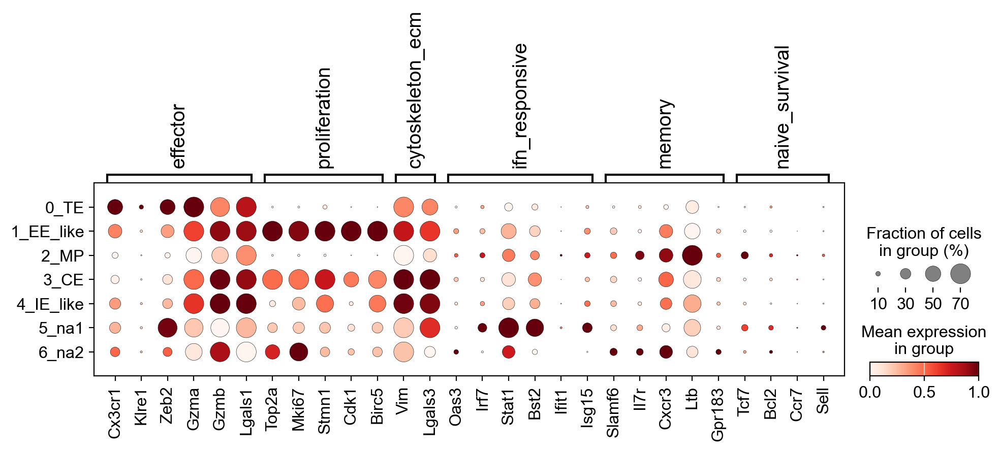

In [24]:
fig, ax = plt.subplots(figsize = (10,4.5))

# Plot the dotplot, grouping cells by their 'leiden' cluster
sc.pl.dotplot(
    adata, 
    marker_dict, 
    groupby='leiden',
    layer='log1p_norm',
    standard_scale='var',  # scales expression per gene for better comparison
    dot_max=0.7,
    ax = ax,
    show = False,
)
fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_marker_dis_dp_mult.eps')

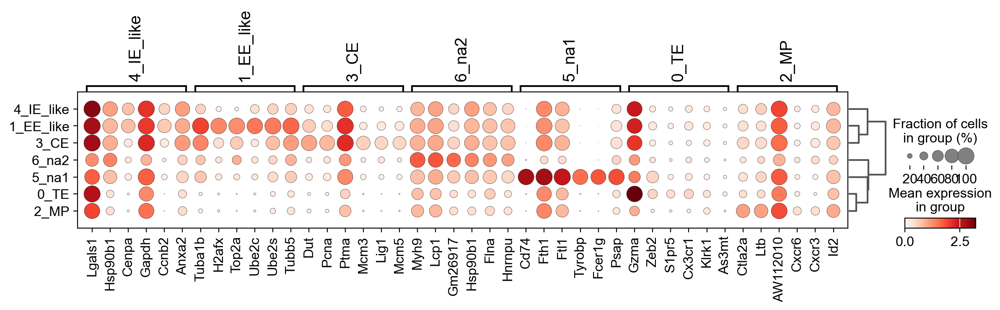

In [25]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', layer = 'log1p_norm')

fig, ax = plt.subplots(figsize = (12,3.8))

sc.pl.rank_genes_groups_dotplot(adata, n_genes=6, show=False,
                               ax = ax)

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_deg_groups_dpmult.eps')

### Analysis

In [26]:
adata.obs['phenotype'] = adata.obs['leiden'].tolist()

new_labels = {
    '2_MP': 'MP',
    '3_CE': 'CE',
    '0_TE': 'TE',
    '4_IE_like': 'IE_like',
    '1_EE_like': 'EE_like',
    '5_na1': 'na1',
    '6_na2': 'na2'
}

adata.obs['phenotype'] = adata.obs['phenotype'].astype('category')
adata.obs['phenotype'] = adata.obs['phenotype'].cat.rename_categories(new_labels)

- calculate enrichment score for each clonotype
- (m/n)/(o/N)
- N = total cells in sample (sample stored in adata.obs.mouse) (In Paper sample meant 1 mouse - here it should be calculated per donor then?, ES was only calculated on clone sizes > 10)
- n = total cells of clonotype (stored as adata.obs.clone_id_aa)
- m = total cells of clonotype in cluster X (cluster is stored in adata.obs.phenotype)
- o = total cells in sample in cluster X



Bias is assigned when:
- ES in MP/ES in TE > 2 (for MP bias and vice versa)

Frequency plot

In [27]:
def get_color(adata, obs, value):
    color=adata.uns[obs+'_colors'][sorted(adata.obs[obs].unique().tolist()).index(value)]
    return(color)
    
def plot_frequencies(adata, groupby, subgrouping=None, subgroup_order=None, normalize=True, stacked=True, order=None, kind='bar',
                     bbox_to_anchor=(1,0.5), celltype_cat='celltype', celltypes_to_plot=[], colors=[], return_df=False, ax='None', figsize=(10,5), legend_columns=1):
    """Plot frequencies of an observable in a stacked bar chart.

    This function plot a stacked bar chart for an observable e.g. cell types
    and can be grouped or subgrouped according to additional parameters

    Parameters
    ----------
    adata : Anndata
        Anndata object
    groupby : str
        observable to group the data on (x-axsis)
    subgrouping : str, None (default: None)
        observable for subgrouping into separate plots
    subgroup_order : list, Series, None (default: None)
        order of subgroup categories for individual plots
    normalize : bool (default: True)
        normalize all cells to max. 1
    stacked : bool (default: True)
        stack the individual bars
    order : list, Series
        order of group categories (x-axsis)
    kind : str (default: 'bar')
        kind of plot to be used
    bbox_to_anchor : Tuple (default: (1,0.5))
        positioning of the legend
    celltype_cat : str (default: 'celltype') 
        observable containing the value information
    celltypes_to_plot : list, Series (default: [])
        resrtict the number of categories, default: plot all
    colors : list, Series (default: [])
        colors for the individual celltypes, default from adata.uns
    return_df : bool (default: False)
        refurn DataFrame with values
    ax : typing.Union[matplotlib.axes._axes.Axes, NoneType], optional (default: None)
        matplotlib axes object. 
    figsize : Tuple (default: (10,5))
        size of the figure
    legend_columns : int (default: 1)
        Number of columns in the legend

    Returns
    -------
    If `return_df==True` a pd.DataFrame object of values
    the plot as matplotlib.axes.Axes object

    """
    remove_ax=False
    if (subgroup_order == None)&(subgrouping!=None):
        subgroup_order=adata.obs[subgrouping].unique()
    if subgrouping != None:
        subgroups=[adata[adata.obs[subgrouping]==x].copy() for x in subgroup_order]
    else:
        subgroups=[adata.copy()]
        subgroup_order=['all cells']
    if ax=='None':
        fig,ax=plt.subplots(ncols=len(subgroups)+1, figsize=figsize, sharey=True)
        remove_ax=True
    else:
        if len(subgroups)>1:
            axx=[]
            for i, group in enumerate(subgroups):
                axx+=[inset_axes(ax,
                              height="100%",
                              width=str(int(1/len(subgroups)*100))+"%", bbox_to_anchor=(i*(1/len(subgroups)),0,0.8,1),
                                bbox_transform=ax.transAxes)]
            ax.remove()
            ax=axx
        else:
            ax=[ax]
    final_colors=[]
    for data, axes, group in zip(subgroups, ax, subgroup_order):
        if celltypes_to_plot==[]:
            celltypes_plot=data.obs[celltype_cat].unique().tolist()
        else:
            celltypes_plot=celltypes_to_plot.copy()
        celltypes_plot.sort()
        if colors==[]:
            if celltype_cat+'_colors' in data.uns.keys():
                final_colors=[get_color(data, celltype_cat, value) for value in celltypes_plot]
        single_donor_adatas=[0]*data.obs[groupby].unique().shape[0]
        single_donor_adatas_names=data.obs[groupby].unique().tolist()
        for i, samplename in enumerate(single_donor_adatas_names):
            single_donor_adatas[i]=data[data.obs[groupby]==samplename,:]
        df=pd.DataFrame()
        for i, adata_s in enumerate (single_donor_adatas):
            df_temp=pd.DataFrame(single_donor_adatas[i].obs[celltype_cat].value_counts())
            df_temp.columns=[single_donor_adatas_names[i]]
            df=df.join(df_temp, how='outer')
        if normalize == True:
            df=df/df.sum()
        if order != None:
            df=df[order]
        if final_colors==[]:
            df.T[celltypes_plot].plot(kind=kind, stacked=stacked, title=group, grid=False, ax=axes, width=0.8)
        else:
            df.T[celltypes_plot].plot(kind=kind, stacked=stacked, title=group, grid=False, color=final_colors, ax=axes, width=0.8)
        axes.legend(loc='center left', bbox_to_anchor=bbox_to_anchor, ncol=legend_columns)
    if len(subgroups)>1:
        for axes in ax[:-2]:
            axes.get_legend().remove()

        ax[-1].remove()
    elif remove_ax==True:
        ax[-1].remove()
    if return_df==True:
        return df

### Order by TE frequency

In [28]:
fraction_series = adata.obs.groupby('mouse')['leiden'].value_counts(normalize=True)
ordered_mouse_list = fraction_series.xs('0_TE', level=1).sort_values(ascending=False).index.tolist()

In [29]:
fraction_series

mouse  leiden   
m41    2_MP         0.403061
       0_TE         0.280612
       1_EE_like    0.137755
       4_IE_like    0.102041
       3_CE         0.066327
                      ...   
m120   2_MP         0.176020
       3_CE         0.160714
       4_IE_like    0.112245
       5_na1        0.012755
       6_na2        0.000000
Name: proportion, Length: 560, dtype: float64

In [30]:
#color_palette = ["#4477AA", "#66CCEE", "#228833", "#CCBB44", "#EE6677", "#AA3377", "#BBBBBB"]
#sc.pl.umap(adata, color='leiden', s=30, show = False, ax=ax, frameon = False, palette = color_palette)

Annotate mouse labels from m1 to m80:

In [31]:
list(adata.obs.mouse.unique())

['m52',
 'm57',
 'm54',
 'm48',
 'm43',
 'm46',
 'm53',
 'm47',
 'm58',
 'm44',
 'm59',
 'm55',
 'm41',
 'm45',
 'm56',
 'm42',
 'm49',
 'm50',
 'm60',
 'm51',
 'm80',
 'm76',
 'm71',
 'm61',
 'm75',
 'm66',
 'm79',
 'm67',
 'm73',
 'm64',
 'm78',
 'm77',
 'm70',
 'm63',
 'm74',
 'm69',
 'm62',
 'm65',
 'm72',
 'm68',
 'm95',
 'm84',
 'm90',
 'm89',
 'm92',
 'm99',
 'm93',
 'm100',
 'm96',
 'm86',
 'm88',
 'm83',
 'm85',
 'm87',
 'm82',
 'm98',
 'm91',
 'm81',
 'm97',
 'm94',
 'm117',
 'm120',
 'm105',
 'm108',
 'm103',
 'm111',
 'm102',
 'm113',
 'm118',
 'm107',
 'm104',
 'm110',
 'm119',
 'm115',
 'm109',
 'm101',
 'm114',
 'm106',
 'm112',
 'm116']

In [32]:
adata.obs['mouse'] = adata.obs['mouse'].apply(
    lambda x: f"m{int(x.lstrip('m')) - 40}"
)
adata.obs['mouse'] = adata.obs['mouse'].astype('category')

In [33]:
list(adata.obs.mouse.unique())

['m12',
 'm17',
 'm14',
 'm8',
 'm3',
 'm6',
 'm13',
 'm7',
 'm18',
 'm4',
 'm19',
 'm15',
 'm1',
 'm5',
 'm16',
 'm2',
 'm9',
 'm10',
 'm20',
 'm11',
 'm40',
 'm36',
 'm31',
 'm21',
 'm35',
 'm26',
 'm39',
 'm27',
 'm33',
 'm24',
 'm38',
 'm37',
 'm30',
 'm23',
 'm34',
 'm29',
 'm22',
 'm25',
 'm32',
 'm28',
 'm55',
 'm44',
 'm50',
 'm49',
 'm52',
 'm59',
 'm53',
 'm60',
 'm56',
 'm46',
 'm48',
 'm43',
 'm45',
 'm47',
 'm42',
 'm58',
 'm51',
 'm41',
 'm57',
 'm54',
 'm77',
 'm80',
 'm65',
 'm68',
 'm63',
 'm71',
 'm62',
 'm73',
 'm78',
 'm67',
 'm64',
 'm70',
 'm79',
 'm75',
 'm69',
 'm61',
 'm74',
 'm66',
 'm72',
 'm76']

In [34]:
fraction_series = adata.obs.groupby('mouse')['leiden'].value_counts(normalize=True)
ordered_mouse_list = fraction_series.xs('0_TE', level=1).sort_values(ascending=False).index.tolist()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


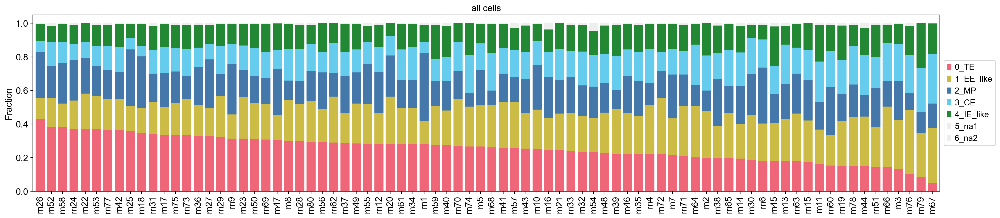

In [35]:
fig, ax = plt.subplots(figsize=(25,5))
plot_frequencies(adata, groupby = 'mouse', celltype_cat = 'leiden', ax = ax, order = ordered_mouse_list)
ax.set_ylabel('Fraction')
fig.savefig(save_figure_sc + 'updated_phenotype_dis.eps')

### Clone size normalization

In [36]:
#update clone size normalization (add +1 for to avoid clone size < 1)

#size factor normalization: Mean amount of antigen-reactive cells per donor is calculated over the whole dataset
# size factor = (Antigen-reactive size mouse donor)/(mean size over whole dateset)
# normalized clone size = (Measured clone size/size factor) + 1 (shifted by 1, to avoid clone size < 1) 
#mean siinfekl reactive size over each donor
mean_size = adata.obs.mouse[adata.obs.specificity=='reactive'].value_counts().mean()
mouse_list = adata.obs.mouse.unique().tolist()
size_factor_list = []

for mouse in mouse_list:
    #individual siinfekl reactive repertoire size
    donor_size = adata.obs.mouse[np.logical_and(adata.obs.specificity=='reactive',adata.obs.mouse==mouse)].value_counts()[0]
    size_factor = donor_size/mean_size
    size_factor_list.append(size_factor)

# get size factors    
d = {'mouse':mouse_list, 'size_factor':size_factor_list}
df = pd.DataFrame(data=d) 

adata.obs['norm_clone_id_aa_size_mouse'] = adata.obs.clone_id_aa_size_mouse

# annotate normalized clone counts
for i, mouse in enumerate(mouse_list):
    size_factor = size_factor_list[i]
    adata.obs.norm_clone_id_aa_size_mouse[adata.obs.mouse==mouse] = (adata.obs.norm_clone_id_aa_size_mouse[adata.obs.mouse==mouse] / size_factor)

## normalize for lowest clone size to keep identical variance
clone_list = adata.obs.clone_id_aa.unique().tolist()
adata.obs['norm_clone_id_aa_size_mouse_2'] = adata.obs.norm_clone_id_aa_size_mouse

cn_min = adata.obs.norm_clone_id_aa_size_mouse.min()
adata.obs.norm_clone_id_aa_size_mouse_2 = adata.obs.norm_clone_id_aa_size_mouse*(1/cn_min)


### Plot counts for each mouse

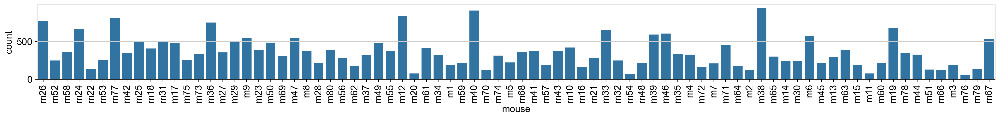

In [37]:
df = pd.DataFrame(adata.obs.mouse.value_counts()).reset_index()

fig, ax = plt.subplots(figsize=(25,2))
sns.barplot(data = df, x = 'mouse', y = 'count', order = ordered_mouse_list, ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

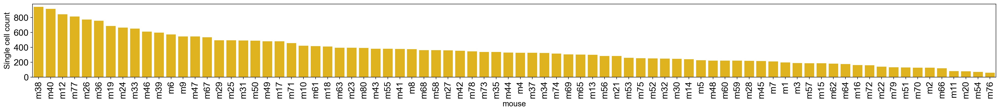

In [38]:
#fraction_series = adata.obs.groupby('mouse')['leiden'].value_counts(normalize=True)
#ordered_mouse_list = fraction_series.xs('0_TE', level=1).sort_values(ascending=False).index.tolist()
df = pd.DataFrame(adata.obs.mouse.value_counts()).reset_index()
ordered_mouse_list = df.sort_values(by='count', ascending=False).mouse.tolist()

fig, ax = plt.subplots(figsize=(25,3))
sns.barplot(data = df, x = 'mouse', y = 'count', order = ordered_mouse_list, ax=ax, color = '#FFC300')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize = 16);
ax.set_ylim(0,980)
ax.grid(False)
ax.set_yticks([0, 200, 400, 600, 800])
ax.set_yticklabels(ax.get_yticklabels(), fontsize = 16);
ax.set_ylabel('Single cell count')

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_selected_cell_counts.eps')


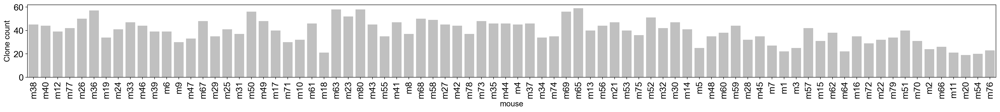

In [39]:
df = pd.DataFrame(adata.obs.groupby('mouse').agg(
    n_clones = ('clone_id_aa','nunique'),
)).reset_index()

fig, ax = plt.subplots(figsize=(25,3))
sns.barplot(data = df, x = 'mouse', y = 'n_clones', order = ordered_mouse_list, ax=ax, color = 'silver')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize = 16);
#ax.set_ylim(0,50)
ax.grid(False)
#ax.set_yticks([0, 200, 400, 600, 800])
ax.set_yticklabels(ax.get_yticklabels(), fontsize = 16);
ax.set_ylabel('Clone count')

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_selected_clone_counts.eps')


### Combine plots and order

In [40]:
#fraction_series = adata.obs.groupby('mouse')['leiden'].value_counts(normalize=True)
#ordered_mouse_list = fraction_series.xs('0_TE', level=1).sort_values(ascending=False).index.tolist()
df = pd.DataFrame(adata.obs.mouse.value_counts()).reset_index()
ordered_mouse_list = df.sort_values(by='count', ascending=False).mouse.tolist()

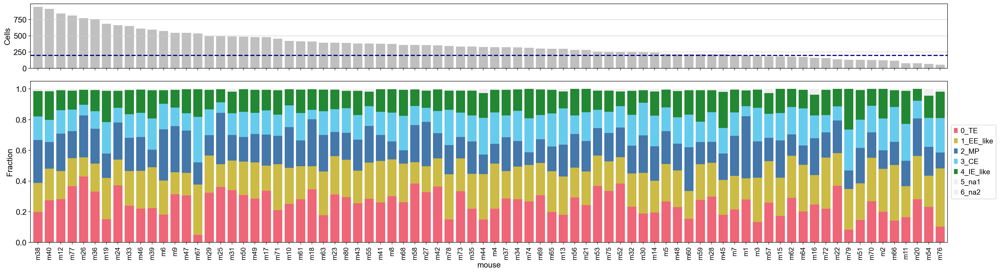

In [41]:
# Create the figure with 2 rows (top: frequencies, bottom: counts)
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(25, 7),
                                sharex=True,
                                gridspec_kw={'height_ratios': [2, 5]})


df = pd.DataFrame(adata.obs.mouse.value_counts()).reset_index()
sns.barplot(data=df, x='mouse', y='count', order=ordered_mouse_list, ax=ax1, color = 'silver')
ax1.set_ylabel('Cells', fontsize=14)
ax1.axhline(y=200, color = 'navy', linestyle='--', linewidth=2)

plot_frequencies(adata, groupby='mouse', celltype_cat='leiden', ax=ax2, order=ordered_mouse_list)
ax2.set_ylabel('Fraction', fontsize=14)
ax2.set_xlabel('mouse')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90, fontsize=12)
ax2.set_title('')

fig.tight_layout()

### Combined single cell size

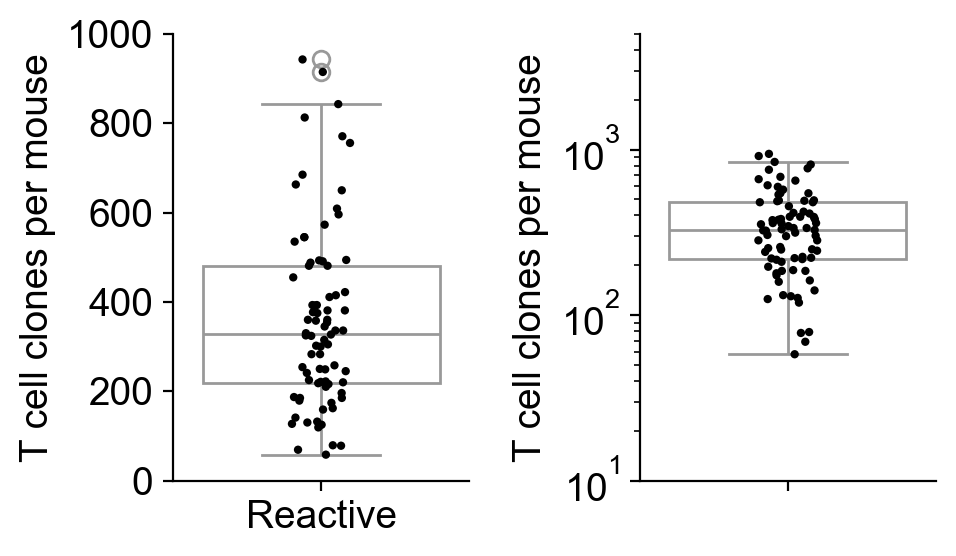

In [42]:
#adata_subset = adata[adata.obs.clone_id_aa_size_mouse>2]
df = pd.DataFrame(adata.obs.mouse.value_counts()).reset_index()

fig, ax = plt.subplots(figsize=(5,3), ncols = 2)

sns.boxplot(y='count', data=df, ax = ax[0], palette = ['white'])
sns.stripplot(y='count', data=df, ax = ax[0], palette = ['black'], jitter=True, s = 3)

ax[0].set_xticklabels(['Reactive'])
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].set_ylim(0,1000)
ax[0].set_ylabel('T cell clones per mouse')
ax[0].grid(False)


#adata_subset = adata[adata.obs.clone_id_aa_size_mouse>2]
df = pd.DataFrame(adata.obs.mouse.value_counts()).reset_index()

sns.boxplot(y='count', data=df, ax = ax[1], palette = ['white'], fliersize = 0)
sns.stripplot(y='count', data=df, ax = ax[1], palette = ['black'], jitter=True, s = 3)

ax[1].set_xticklabels([''])
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].set_yscale('log')
ax[1].set_ylim(10,5000)
ax[1].set_ylabel('Cells per mouse')
ax[1].set_ylabel('T cell clones per mouse')
ax[1].grid(False)


fig.tight_layout()

## Calculate enrichment score and annotate in adata

In [43]:
# Loop over each donor (stored in adata.obs.mouse)
for donor in adata.obs['mouse'].unique():
    # Get boolean index for cells from the current donor
    donor_idx = adata.obs['mouse'] == donor
    donor_obs = adata.obs.loc[donor_idx]

    # Total number of cells for this donor (N)
    donor_N = donor_obs.shape[0]

    # Clonotype counts for this donor (n for each clonotype)
    donor_clone_counts = donor_obs['clone_id_aa'].value_counts().to_dict()

    # Phenotype counts for this donor (o for each phenotype)
    donor_phenotype_counts = donor_obs['phenotype'].value_counts().to_dict()

    # Loop over each phenotype present in this donor's data
    for pheno in donor_obs['phenotype'].unique():
        # Subset donor cells with the current phenotype
        donor_obs_pheno = donor_obs[donor_obs['phenotype'] == pheno]

        # Count clonotypes within this phenotype (m for each clonotype)
        donor_clone_counts_pheno = donor_obs_pheno['clone_id_aa'].value_counts().to_dict()

        # Total cells with the current phenotype (o)
        donor_o = donor_phenotype_counts[pheno]

        # Dictionary to hold enrichment scores for each clonotype for this phenotype in this donor
        enrichment_dict = {}

        # Compute enrichment score for each clonotype in the donor
        for clone, n in donor_clone_counts.items():
            m = donor_clone_counts_pheno.get(clone, 0)
            # Avoid division by zero
            if n > 0 and donor_o > 0 and m > 0 and donor_N > 0:
                enrichment = (m / n) * (donor_N / donor_o)
            else:
			# if zero division, add +1 to numerator and denominator to allow for score calculation (ratio is kept the same)
                enrichment = ((m + 1) / (n + 1)) * ((donor_N + 1) / (donor_o + 1))
            enrichment_dict[clone] = enrichment

        # Define the new column name (e.g., "Effector_ES" if pheno == "Effector")
        col_name = f"{pheno}_ES"

        # Initialize the column if it doesn't exist yet (set to NaN)
        if col_name not in adata.obs.columns:
            adata.obs[col_name] = pd.NA

        # Map the enrichment score for each cell in the donor based on its clonotype
        adata.obs.loc[donor_idx, col_name] = donor_obs['clone_id_aa'].map(enrichment_dict)



In [44]:
#### check for NaN
# 1. Check if there are *any* NaNs (True/False)
has_nans = adata.obs['MP_ES'].isna().any()
print("Contains NaNs MP ES?", has_nans)

# 2. Count how many NaNs
n_nans = adata.obs['MP_ES'].isna().sum()
print("Number of NaNs MP ES:", n_nans)

has_nans = adata.obs['TE_ES'].isna().any()
print("Contains NaNs TE ES?", has_nans)

n_nans = adata.obs['TE_ES'].isna().sum()
print("Number of NaNs TE ES:", n_nans)

Contains NaNs MP ES? False
Number of NaNs MP ES: 0
Contains NaNs TE ES? False
Number of NaNs TE ES: 0


In [45]:
#Calculate enrichment ratio
adata.obs['MP_over_TE'] = adata.obs['MP_ES'] / adata.obs['TE_ES']
adata.obs['TE_over_MP'] = adata.obs['TE_ES'] / adata.obs['MP_ES']

In [46]:
#### check for NaN
# 1. Check if there are *any* NaNs (True/False)
has_nans = adata.obs['MP_over_TE'].isna().any()
print("Contains NaNs MP_over_TE?", has_nans)

# 2. Count how many NaNs
n_nans = adata.obs['MP_over_TE'].isna().sum()
print("Number of NaNs MP_over_TE:", n_nans)

has_nans = adata.obs['TE_over_MP'].isna().any()
print("Contains NaNs TE_over_MP?", has_nans)

n_nans = adata.obs['TE_over_MP'].isna().sum()
print("Number of NaNs TE_over_MP:", n_nans)

Contains NaNs MP_over_TE? False
Number of NaNs MP_over_TE: 0
Contains NaNs TE_over_MP? False
Number of NaNs TE_over_MP: 0


assign enrichment (bias)

In [47]:
# set everything to not_assigned, next filter for criteria to allow for assignment
adata.obs['bias'] = 'not_assigned'

# everything above size 10 is set to unbiased
# when Enrichment and Score ratio is fullfilled assign bias
adata.obs.bias[adata.obs.clone_id_aa_size_mouse>10] = 'unbiased'
adata.obs.bias[np.logical_and(np.logical_and(adata.obs.clone_id_aa_size_mouse>10, adata.obs['MP_over_TE']>2), adata.obs['MP_ES']>1)] = 'mem'
adata.obs.bias[np.logical_and(np.logical_and(adata.obs.clone_id_aa_size_mouse>10, adata.obs['TE_over_MP']>2), adata.obs['TE_ES']>1)] = 'eff'
adata.obs['bias'] = adata.obs['bias'].astype('category')


## Export relevant data for enrichment score analysis

### Calculate sharedness

In [48]:
df_shared = adata.obs.groupby('clone_id_aa').agg(
    shared_mouse_dp_mult = ('mouse','nunique'),
    clonotype = ('clone_id_aa','first'),
)
df_shared = df_shared.dropna()
df_shared = df_shared[df_shared.shared_mouse_dp_mult>1]
df_shared = df_shared.reset_index()

adata.obs['shared_mouse_dp_mult']=1
for clonotype in df_shared.clonotype.tolist():
    adata.obs.shared_mouse_dp_mult[adata.obs.clone_id_aa==clonotype] = df_shared.loc[df_shared.clonotype==clonotype, 'shared_mouse_dp_mult'].item()
    

2675 unique clones


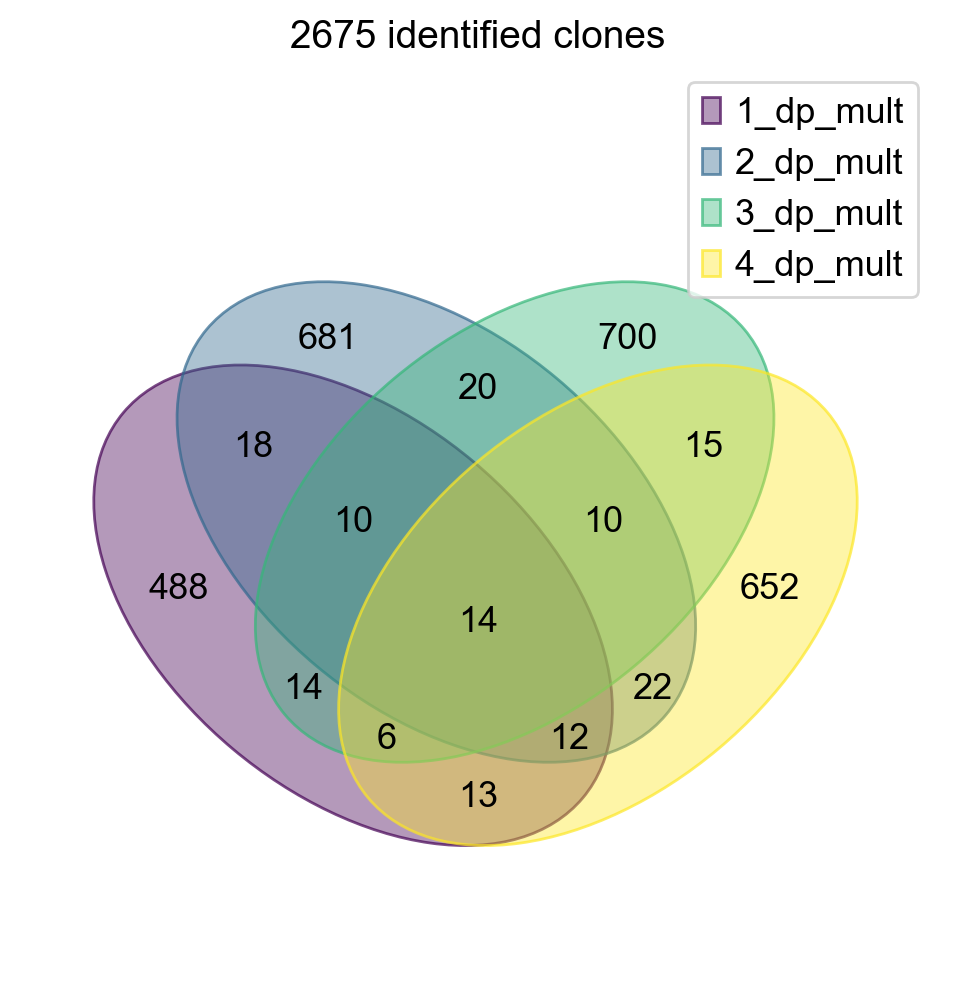

In [49]:
import venn
dpmult_list = ['1_dp_mult','2_dp_mult','3_dp_mult','4_dp_mult']
c_dict = {}

for i, exp in enumerate(dpmult_list):
    c_list = adata.obs.clone_id_aa[adata.obs.experiment==exp].tolist()
    c_dict[exp] = set(c_list)


fig, ax = plt.subplots(figsize=(5,6))

venn.venn(c_dict, ax=ax, legend_loc='best')
ax.set_title(str(adata.obs.clone_id_aa.nunique()) + ' identified clones')
print(str(adata.obs.clone_id_aa.nunique()) + ' unique clones')

fig.tight_layout()

Repertoire size per mouse

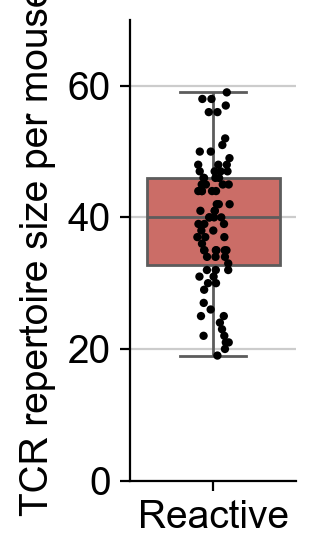

In [50]:
#adata_subset = adata[adata.obs.clone_id_aa_size_mouse>2]
df = pd.DataFrame(adata.obs.groupby('mouse').agg(
    n_clones = ('clone_id_aa', 'nunique')
))

fig, ax = plt.subplots(figsize=(1.8,3))

sns.boxplot(y='n_clones', data=df, ax = ax, palette = 'hls')
sns.stripplot(y='n_clones', data=df, ax = ax, palette = ['black'], jitter=True, s = 3)

ax.set_xticklabels(['Reactive'])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylim(0,70)
ax.set_ylabel('TCR repertoire size per mouse')

fig.tight_layout()

# Plot clone size and sharedness in dpmult data

Plot only inbetween this data set

76


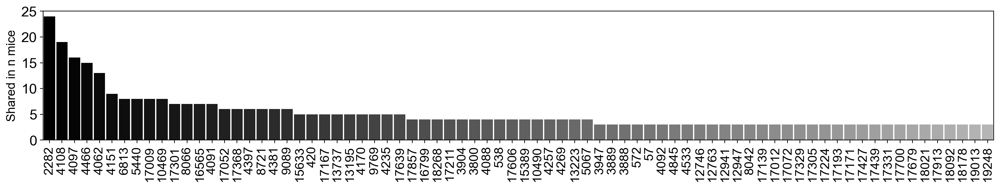

In [92]:
import matplotlib as mpl
clone_list = adata.obs.clone_id_aa[np.logical_and(adata.obs.shared_mouse_dp_mult>2, adata.obs.specificity=='reactive')].unique().tolist()

adata_sub = adata[adata.obs.clone_id_aa.isin(clone_list)]

#cmap = sns.dark_palette("#69d", reverse=False, as_cmap=True)
#cmap = sns.dark_palette("#e9af33", reverse=False, as_cmap=True)
n_colors = len(clone_list)
cmap = mpl.cm.get_cmap("Greys_r")
color_palette = [cmap(x) for x in np.linspace(0, 0.6, n_colors)]

df = pd.DataFrame(adata_sub.obs.groupby('clone_id_aa').agg(
    clone_id_aa = ('clone_id_aa','first'),
    shared_mouse = ('shared_mouse_dp_mult','first'),
)).dropna()
df = df.sort_values(by='shared_mouse', ascending = False)
df = df.reset_index(drop = True)

fig, ax = plt.subplots(figsize = (16,3.2))
order = df.sort_values('shared_mouse', ascending=False)['clone_id_aa']
sns.barplot(data=df, x='clone_id_aa', y='shared_mouse', order=order, ax=ax, palette = color_palette, width = 0.9, fill = True, linewidth=3)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=14.5)

ax.set_yticklabels([0,5,10,15,20,25], fontsize=16)
ax.set_ylim(0,25)
ax.set_ylabel('Shared in n mice')
ax.grid(False)
ax.set_xlabel('')

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_selected_sharedness.eps')

print(len(clone_list))

Plot clonal expansion and rank'

In [93]:
df = adata_sub.obs.groupby(['clone_id_aa', 'mouse']).agg(
    shared_mouse = ('shared_mouse', 'first'),
    clone_id_aa_size_mouse=('clone_id_aa_size_mouse', 'first'),
    norm_clone_id_aa_size_mouse=('norm_clone_id_aa_size_mouse_2', 'first'),
    clone_id_aa_rank=('clone_id_aa_rank', 'first'),
    TE_ES=('TE_ES', 'first'),
    MP_ES=('MP_ES', 'first'),
    MP_over_TE=('MP_over_TE', 'first'),
    TE_over_MP=('TE_over_MP', 'first'),
    bias=('bias', 'first'),
    
).reset_index()

In [94]:
df = df.dropna()

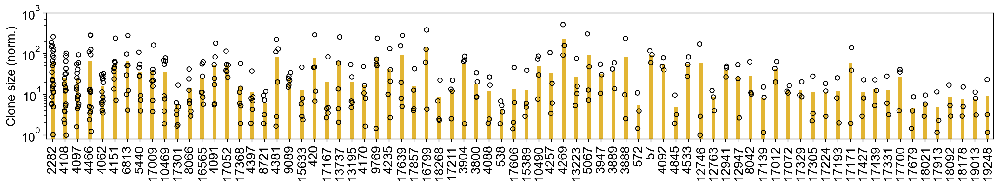

In [101]:
# Convert clone_id_aa to a categorical variable with the specified order
df['clone_id_aa'] = pd.Categorical(df['clone_id_aa'], categories=list(order), ordered=True)


# Plot the dotplot: one dot per entry (using jitter to avoid overlapping)
fig, ax = plt.subplots(figsize = (16,3.2))

#sns.stripplot(data=df, x='clone_id_aa', y='norm_clone_id_aa_size_mouse', jitter=True, ax=ax, palette = ['black'])
sns.stripplot(data=df, x='clone_id_aa', y='norm_clone_id_aa_size_mouse', jitter=True, ax=ax, linewidth=1, edgecolor='black',
             marker='o', facecolors='none',)
#sns.boxplot(data=df, x='clone_id_aa', y='norm_clone_id_aa_size_mouse', ax=ax, palette = ['gray'], width = 0.3, fill = False, fliersize = 0)
sns.barplot(data=df, x='clone_id_aa', y='norm_clone_id_aa_size_mouse', ax=ax, palette = ['#ffc316'], width = 0.3, errorbar=None)

ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=14.5)
#ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
ax.set_yscale('log')
ax.set_ylim(0.8, 1000)
ax.set_ylabel('Clone size (norm.)')

ax.grid(False)
ax.set_xlabel('')

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_selected_clone_size.eps')


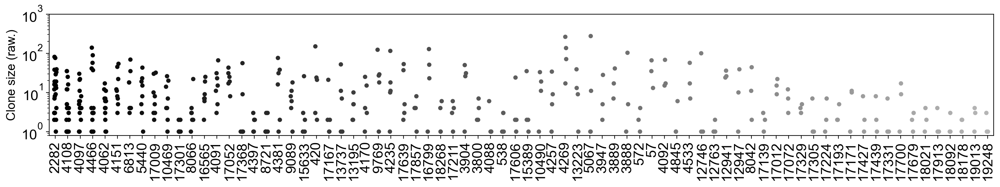

In [102]:
# Convert clone_id_aa to a categorical variable with the specified order
df['clone_id_aa'] = pd.Categorical(df['clone_id_aa'], categories=list(order), ordered=True)


# Plot the dotplot: one dot per entry (using jitter to avoid overlapping)
fig, ax = plt.subplots(figsize = (16,3.2))

sns.stripplot(data=df, x='clone_id_aa', y='clone_id_aa_size_mouse', jitter=True, ax=ax, palette = color_palette)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=16)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
ax.set_yscale('log')
ax.set_ylim(0.8, 1000)
ax.set_ylabel('Clone size (raw.)')

ax.grid(False)
ax.set_xlabel('')

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_selected_clone_size_raw.eps')


In [103]:
df.to_excel('./IMMUNITY_clone_size_df.xlsx')

In [104]:
df.groupby('clone_id_aa').agg(
    mean_norm_size = ('norm_clone_id_aa_size_mouse','mean'),
    mean_raw_size = ('clone_id_aa_size_mouse','mean'),
    mean_TE_ES = ('TE_ES','mean'),
    mean_MP_ES = ('MP_ES','mean'),
).to_excel('./IMMUNITY_clone_size_df_aggregated_mean.xlsx')

# Calculate size variance 

Export data for R analysis and variance calculations

In [105]:
df.norm_clone_id_aa_size_mouse = df.norm_clone_id_aa_size_mouse.astype(float)

In [106]:
relevant_cols = ['clone_id_aa','mouse','shared_mouse','clone_id_aa_size_mouse','norm_clone_id_aa_size_mouse']
df[relevant_cols].to_excel('./updated_data_variance_clone_size.xlsx', index=False)

## Get shared clones and mice with bias assignments in at least 3 mice for phenotypic comparison of TCR identical T cell clones between donors

In [107]:
bias_list = ['eff', 'mem', 'unbiased']

filtered_clones = adata.obs.groupby('clone_id_aa').filter(
    lambda group: group.loc[group['bias'].isin(bias_list), 'mouse'].nunique() >= 3
)

clone_list = filtered_clones.clone_id_aa.unique().tolist()

print(len(clone_list))

22


In [108]:
#subet to clone list
adata_sub = adata[adata.obs.clone_id_aa.isin(clone_list)]

#get consistent clone ordering over plots
df = pd.DataFrame(adata_sub.obs.groupby('clone_id_aa').agg(
    clone_id_aa = ('clone_id_aa','first'),
    shared_mouse = ('shared_mouse_dp_mult','first'),
    
)).dropna()
#df = df.sort_values(by='shared_mouse', ascending = False)
#df = df.reset_index(drop = True)
#order = df.sort_values('shared_mouse', ascending=False)['clone_id_aa']

Assign clone order from left to right according to sharedness and phenotype enrichment assignment

In [109]:
# 1) Make a mask for just the bias categories you care about:
mask = adata_sub.obs['bias'].isin(['eff', 'mem'])

# 2) For each clone, count how many *distinct* mice have at least one 'eff' or 'mem':
unique_mouse_counts = (
    adata_sub.obs[mask]
    .groupby('clone_id_aa')['mouse']
    .nunique()
)

# 3) Map that back onto your df (in the same order) and fill any clones with 0:
df['sum_bias_assigned'] = (
    df['clone_id_aa']
      .map(unique_mouse_counts)     # look up the count for each clone
      .fillna(0)                    # clones with no eff/mem get zero
      .astype(int)                  # make it integer
)

mask = adata_sub.obs['bias'].isin(['eff', 'mem', 'unbiased'])

# 2) For each clone, count how many *distinct* mice have at least one 'eff' or 'mem':
unique_mouse_counts = (
    adata_sub.obs[mask]
    .groupby('clone_id_aa')['mouse']
    .nunique()
)

# 3) Map that back onto your df (in the same order) and fill any clones with 0:
df['sum_bias_any'] = (
    df['clone_id_aa']
      .map(unique_mouse_counts)     # look up the count for each clone
      .fillna(0)                    # clones with no eff/mem get zero
      .astype(int)                  # make it integer
)

Assigned plotting order

In [110]:
df = df.sort_values(by=['sum_bias_any','sum_bias_any'], ascending = [False,False])
df = df.reset_index(drop = True)
order = df.sort_values(by=['sum_bias_any','sum_bias_any'], ascending = [False,False])['clone_id_aa']

Plot sharedness of new clones

In [111]:
n_colors = len(clone_list)
cmap = mpl.cm.get_cmap("Greys_r")
color_palette = [cmap(x) for x in np.linspace(0, 0.6, n_colors)]

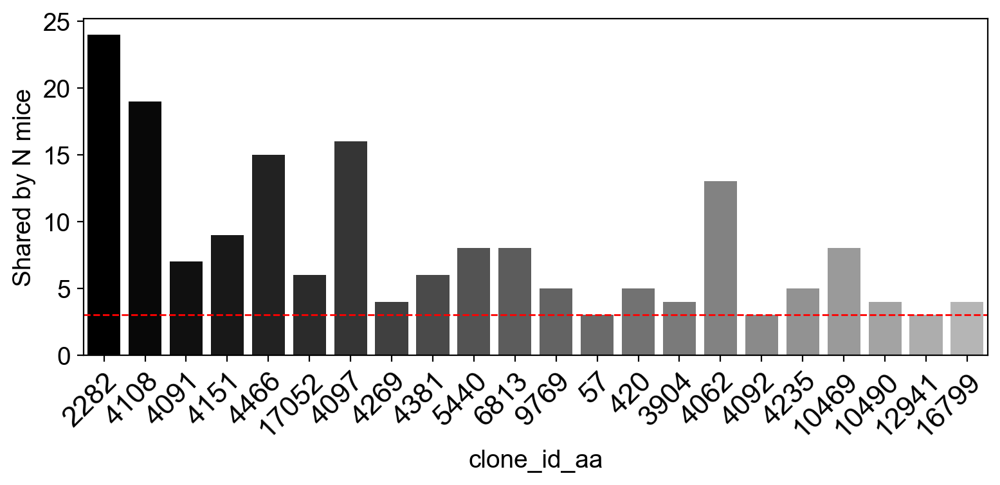

In [112]:
fig, ax = plt.subplots(figsize = (8,4))
sns.barplot(data=df, x='clone_id_aa', y='shared_mouse', order=order, ax=ax, palette = color_palette)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode = 'anchor', fontsize = 16)
ax.axhline(y=3, linewidth=1, color='r', linestyle='--')
ax.set_ylabel('Shared by N mice')
ax.grid(False)

fig.tight_layout()

Get plotting dataframe

In [113]:
df = adata_sub.obs.groupby(['clone_id_aa', 'mouse']).agg(
    shared_mouse = ('shared_mouse_dp_mult', 'first'),
    clone_id_aa_size_mouse=('clone_id_aa_size_mouse', 'first'),
    norm_clone_id_aa_size_mouse=('norm_clone_id_aa_size_mouse_2', 'first'),
    clone_id_aa_rank=('clone_id_aa_rank', 'first'),
    TE_ES=('TE_ES', 'first'),
    MP_ES=('MP_ES', 'first'),
    MP_over_TE=('MP_over_TE', 'first'),
    TE_over_MP=('TE_over_MP', 'first'),
    bias=('bias', 'first'),
    
).reset_index()
df = df.dropna()

Text(0, 0.5, 'Clone size (raw)')

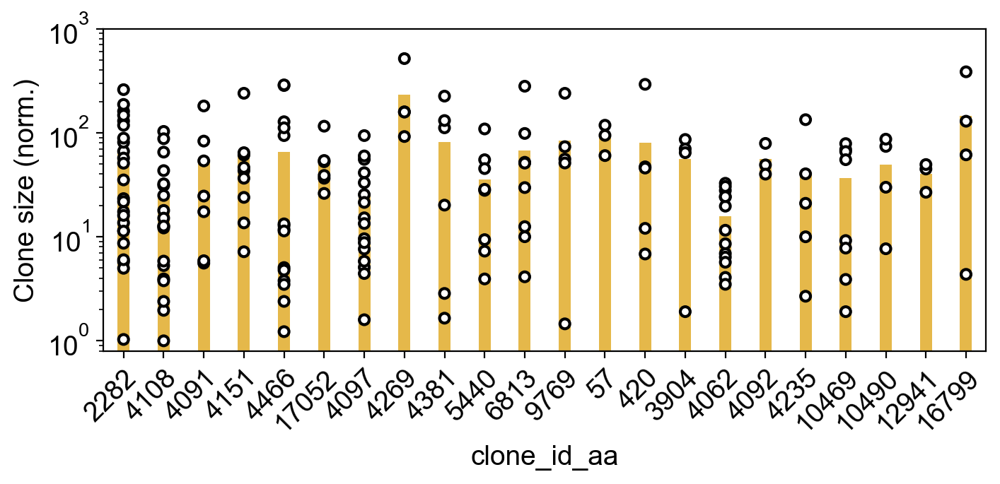

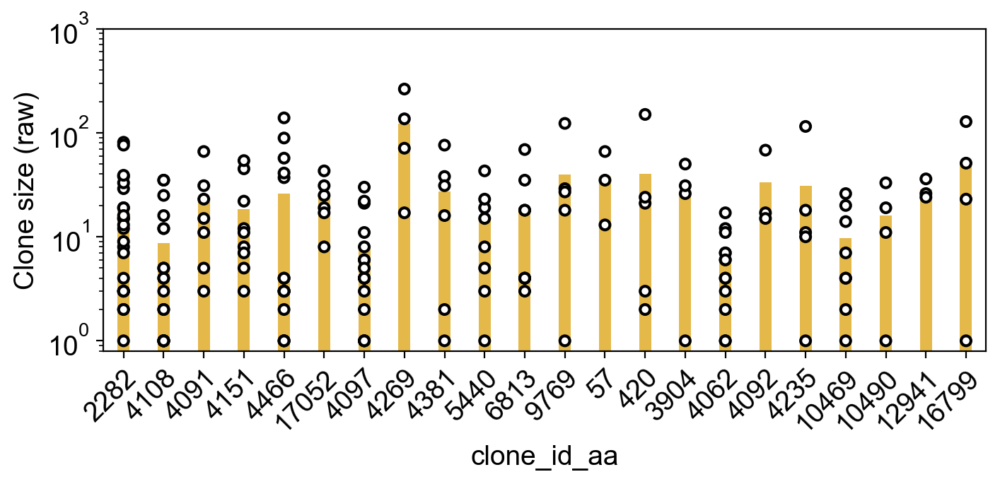

In [114]:
# Convert clone_id_aa to a categorical variable with the specified order
df['clone_id_aa'] = pd.Categorical(df['clone_id_aa'], categories=list(order), ordered=True)

# Plot the dotplot: one dot per entry (using jitter to avoid overlapping)
fig, ax = plt.subplots(figsize = (8,3))
sns.stripplot(data=df, x='clone_id_aa', y='norm_clone_id_aa_size_mouse', jitter=False, ax=ax, palette = ['white'], linewidth=1.5, edgecolor='black')
sns.barplot(data=df, x='clone_id_aa', y='norm_clone_id_aa_size_mouse', ax=ax, palette = ['#ffc330'], width = 0.3, errorbar = None)
ax.grid(False)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode = 'anchor')
ax.set_yscale('log')
ax.set_ylim(0.8, 1000)
ax.set_ylabel('Clone size (norm.)')

# Convert clone_id_aa to a categorical variable with the specified order
df['clone_id_aa'] = pd.Categorical(df['clone_id_aa'], categories=list(order), ordered=True)

# Plot the dotplot: one dot per entry (using jitter to avoid overlapping)
fig, ax = plt.subplots(figsize = (8,3))
sns.stripplot(data=df, x='clone_id_aa', y='clone_id_aa_size_mouse', jitter=False, ax=ax, palette = ['white'], linewidth=1.5, edgecolor='black')
sns.barplot(data=df, x='clone_id_aa', y='clone_id_aa_size_mouse', ax=ax, palette = ['#ffc330'], width = 0.3, errorbar = None)
ax.grid(False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode = 'anchor')
ax.set_yscale('log')
ax.set_ylim(0.8, 1000)
ax.set_ylabel('Clone size (raw)')


## Get score distribution over each clone

drop not assigned

In [115]:
df = df[df.bias!='not_assigned']

Sorted by data by sharedness and assigned bias

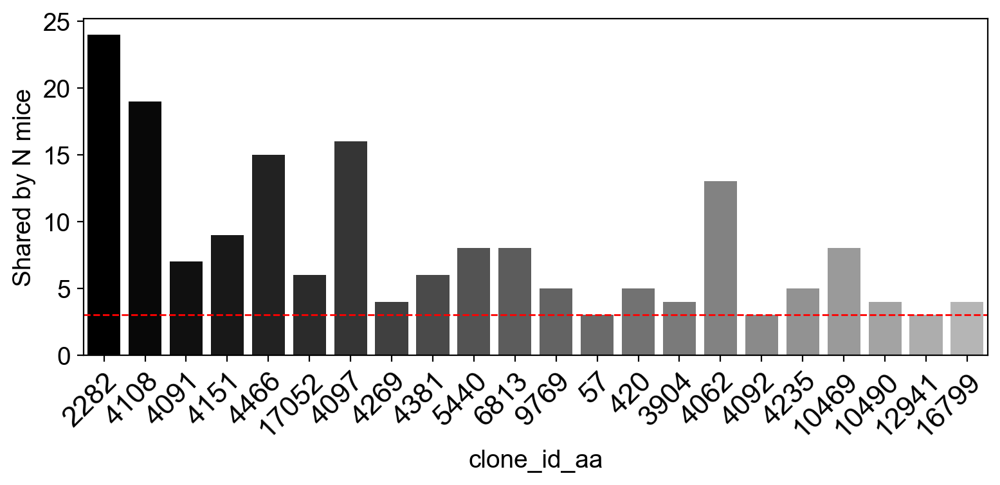

In [116]:
fig, ax = plt.subplots(figsize = (8,4))
sns.barplot(data=df, x='clone_id_aa', y='shared_mouse', order=order, ax=ax, palette = color_palette)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode = 'anchor', fontsize = 16)
ax.axhline(y=3, linewidth=1, color='r', linestyle='--')
ax.set_ylabel('Shared by N mice')
ax.grid(False)

fig.tight_layout()

In [117]:
df[df.clone_id_aa=='4466']

,clone_id_aa,mouse,shared_mouse,clone_id_aa_size_mouse,norm_clone_id_aa_size_mouse,clone_id_aa_rank,TE_ES,MP_ES,MP_over_TE,TE_over_MP,bias
984,4466,m10,15.0,57.0,127.636364,2.0,0.279378,0.594925,2.129464,0.469602,unbiased
987,4466,m13,15.0,89.0,284.313993,1.0,0.873908,0.054368,0.062212,16.074074,unbiased
1014,4466,m41,15.0,37.0,93.853659,2.0,0.100478,0.955236,9.506877,0.105187,unbiased
1041,4466,m71,15.0,139.0,288.478936,2.0,1.5003,0.233813,0.155844,6.416667,eff
1048,4466,m78,15.0,41.0,111.558140,2.0,0.809099,1.274945,1.575758,0.634615,unbiased


In [118]:
sns.stripplot(data=df, x='clone_id_aa', y='clone_id_aa_size_mouse', jitter=False, ax=ax, palette = ['white'], linewidth=1.5, edgecolor='black')
sns.barplot(data=df, x='clone_id_aa', y='clone_id_aa_size_mouse', ax=ax, palette = ['#ffc330'], width = 0.3, errorbar = None)

<Axes: xlabel='clone_id_aa', ylabel='Shared by N mice'>

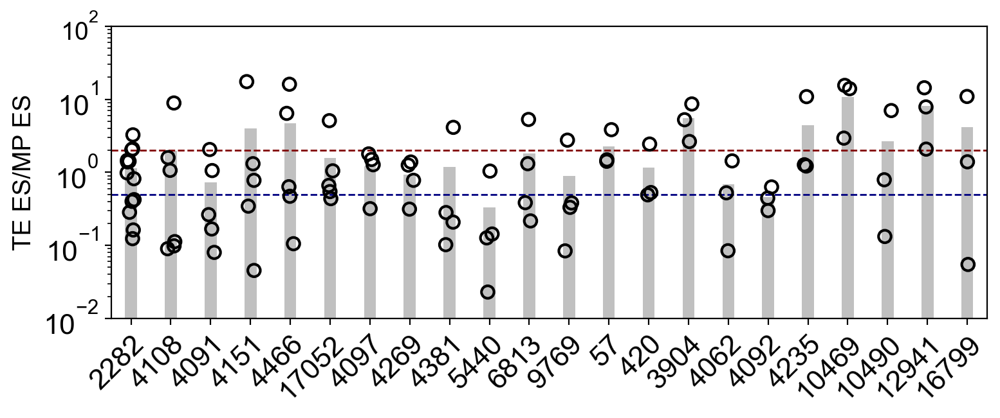

In [126]:
# Convert clone_id_aa to a categorical variable with the specified order
df['clone_id_aa'] = pd.Categorical(df['clone_id_aa'], categories=list(order), ordered=True)

# Plot the dotplot: one dot per entry (using jitter to avoid overlapping)
fig, ax = plt.subplots(figsize = (8,3.5))

sns.stripplot(data=df, x='clone_id_aa', y='TE_over_MP', jitter=True, ax=ax, linewidth=1.5, edgecolor='black',
             marker='o', facecolors='none', s=7)
sns.barplot(data=df, x='clone_id_aa', y='TE_over_MP', ax=ax, palette = ['silver'], width = 0.3, errorbar = None)

#sns.stripplot(data = df, x='clone_id_aa', y='TE_over_MP', jitter=0.2, ax=ax, palette = color_palette, edgecolor = 'black', linewidth = 0, s = 8)
#sns.boxplot(data=df, x='clone_id_aa', y='MP_over_TE', ax=ax, palette = ['gray'], width = 0.3, fill = False, fliersize = 0)

#sns.stripplot(data = df[df.MP_over_TE>2], x='clone_id_aa', y='MP_over_TE', jitter=0.2, ax=ax, palette = color_palette, edgecolor = 'maroon', linewidth = 1.5, s = 8)
#sns.stripplot(data = df[df.MP_over_TE<0.5], x='clone_id_aa', y='MP_over_TE', jitter=0.2, ax=ax, palette = color_palette, edgecolor = 'navy', linewidth = 1.5, s = 8)

ax.axhline(y = 2, linewidth=1, color='maroon', linestyle='--')
ax.axhline(y = 0.5, linewidth=1, color='navy', linestyle='--')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode='anchor', fontsize = 16)
ax.set_yticklabels(ax.get_yticklabels(), fontsize = 16)

ax.set_yscale('log')
ax.set_ylim(0.01, 100)
ax.set_ylabel('TE ES/MP ES')
ax.grid(False)
ax.set_xlabel('')

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_selected_bias_score.eps')


### Export for further calculations in R

In [73]:
relevant_cols = ['clone_id_aa','mouse','shared_mouse','TE_over_MP','TE_ES','MP_ES']
df[relevant_cols].to_excel('./data_variance_enirchment_score.xlsx',index=False)

In [74]:
leiden_dict = {
    '2_MP': "#4477AA",    # dark blue
    '3_CE': "#66CCEE",    # light blue
    '0_TE': "#EE6677",    # pink/red
    '4_IE_like': "#228833", # green
    '1_EE_like': "#CCBB44", # yellow
    '5_na1': "#EEEEEE",    # gray
    '6_na2': "#EEEEEE"     # gray
}

# Frequency of bias per clone

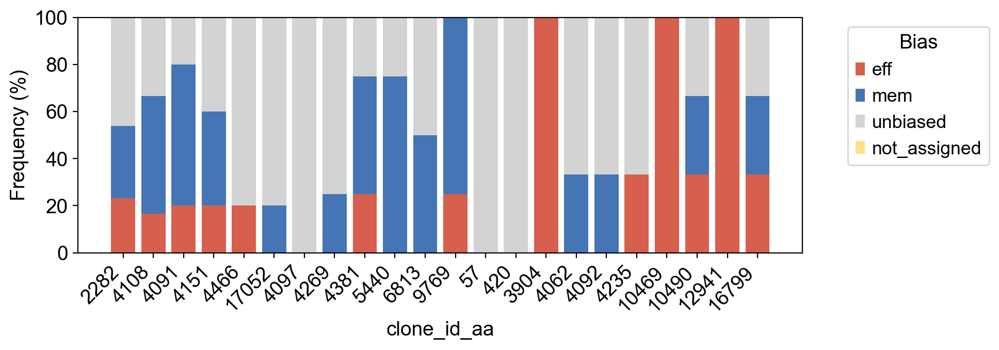

In [75]:
color_dict = {
    'eff': '#D6604D',      # muted red
    'mem': '#4575B4',      # muted blue
    'unbiased': '#D3D3D3', # muted gray
    'not_assigned': '#FEE08B'  # muted_yellow
}

# Ensure clone_id_aa is a categorical variable with the specified order.
df['clone_id_aa'] = pd.Categorical(df['clone_id_aa'], categories=list(order), ordered=True)

# Create a frequency table for 'bias' for each clone_id_aa.
bias_freq = df.groupby(['clone_id_aa', 'bias']).size().unstack(fill_value=0)
# Reindex the DataFrame to ensure the clone order matches your specified order.
bias_freq = bias_freq.reindex(list(order))
# Normalize each row (each clone) so that the sum equals 100%.
bias_freq = bias_freq.div(bias_freq.sum(axis=1), axis=0) * 100
# Specify the order of the bias categories for plotting
bias_order = ['eff', 'mem', 'unbiased', 'not_assigned']


fig, ax = plt.subplots(figsize=(9, 3))
# Initialize the bottom positions for the stacked bars.
bottom = np.zeros(len(bias_freq))
# Loop over each bias category in the desired order and plot the corresponding segment.
for bias in bias_order:
    # Only plot if the bias is present in the DataFrame columns.
    if bias in bias_freq.columns:
        values = bias_freq[bias].values
        ax.bar(bias_freq.index, values, bottom=bottom, color=color_dict[bias], label=bias)
        bottom += values

# Formatting the plot.
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_ylabel('Frequency (%)')
ax.set_xlabel('clone_id_aa')
ax.legend(title='Bias', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(False)

Frequency of bias per clone but dropped not_assigned

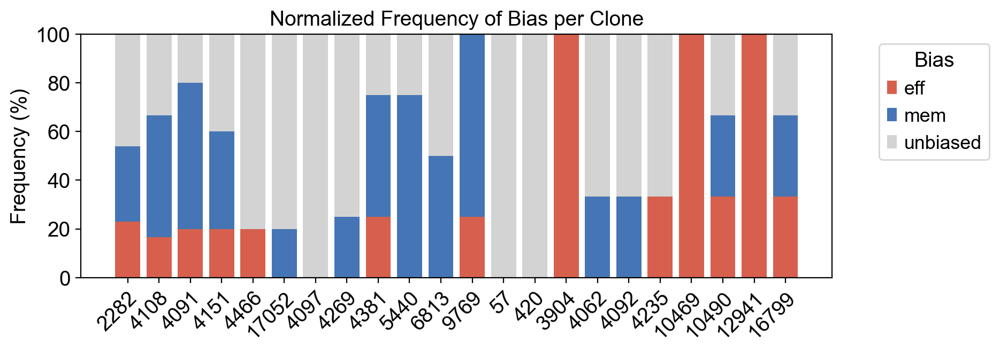

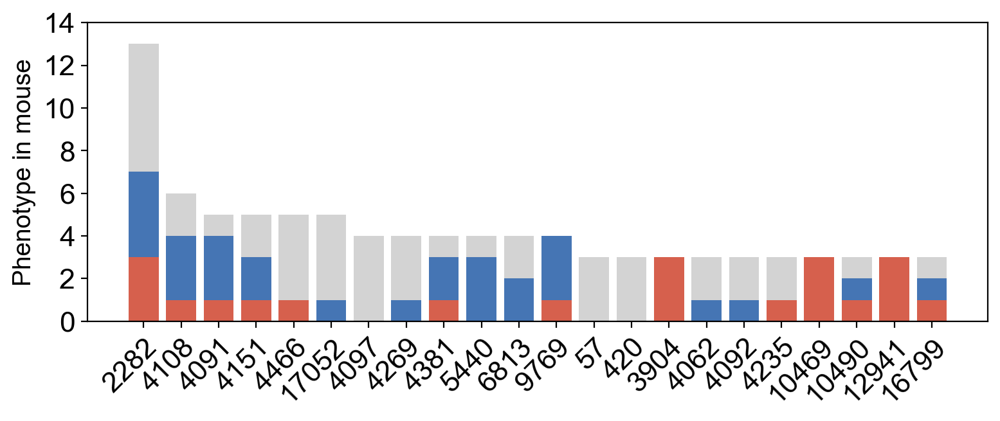

In [76]:
# Create a frequency table for 'bias' for each clone.
bias_freq = df.groupby(['clone_id_aa', 'bias']).size().unstack(fill_value=0)

# Drop the 'not_assigned' column if it exists.
if 'not_assigned' in bias_freq.columns:
    bias_freq = bias_freq.drop(columns='not_assigned')

# Reindex the frequency table so that all clones in clone_order appear, even if with all zeros.
bias_freq = bias_freq.reindex(list(order), fill_value=0)

# Define the bias order for plotting (without 'not_assigned').
bias_order = ['eff', 'mem', 'unbiased']

### Plot 1: Normalized Stacked Bar Plot (Percentage Frequency)
# Normalize each clone's counts to 100% (if a clone has all zeros, avoid division by zero by replacing with 1)
bias_freq_norm = bias_freq.div(bias_freq.sum(axis=1).replace(0, 1), axis=0) * 100

fig, ax = plt.subplots(figsize=(9, 3))
bottom = np.zeros(len(bias_freq_norm))
for bias in bias_order:
    if bias in bias_freq_norm.columns:
        values = bias_freq_norm[bias].values
        ax.bar(bias_freq_norm.index, values, bottom=bottom, color=color_dict[bias], label=bias)
        bottom += values

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode='anchor')
ax.set_ylabel('Frequency (%)')
#ax.set_xlabel('clone_id_aa')
ax.set_title("Normalized Frequency of Bias per Clone")
ax.legend(title='Bias', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(False)

################################################################
##### Show absolute counts

fig, ax = plt.subplots(figsize=(8, 3.5))
bottom = np.zeros(len(bias_freq))
for bias in bias_order:
    if bias in bias_freq.columns:
        values = bias_freq[bias].values
        ax.bar(bias_freq.index, values, bottom=bottom, color=color_dict[bias], label=bias)
        bottom += values

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode='anchor', fontsize = 16)
ax.set_yticks([0,2,4,6,8,10,12,14])
ax.set_yticklabels(ax.get_yticklabels(), fontsize = 16)
ax.set_ylabel('Phenotype in mouse')

#ax.set_title("Absolute Counts of Bias per Clone")
#ax.legend(title='Bias', bbox_to_anchor=(1.05, 1), loc='upper left')
#ax.set_ylim([0,14])
ax.grid(False)
#ax.get_legend().remove()

fig.tight_layout()
fig.savefig(save_figure_sc + 'updated_selected_bias_category.eps')

## Plot UMAPs for these clones

Get all clones which appear over these 3 biases (or at least eff and mem) - then filter for clones with high score

In [77]:
bias_list = ['eff', 'mem', 'unbiased']

filtered_clones = pd.DataFrame(adata.obs.groupby('clone_id_aa').filter(
    lambda group: set(bias_list).issubset(set(group['bias']))
))

clone_list = filtered_clones.clone_id_aa.unique().tolist()

In [78]:
color_dict = {
    'eff': '#D6604D',      # muted red
    'mem': '#4575B4',      # muted blue
    'unbiased': 'black', # muted gray
    'not_assigned': '#FEE08B'  # muted_yellow
}

## UMAP KDE Overlay for all shared clones with assigned phenotype bias

In [79]:
df = adata_sub.obs.groupby(['clone_id_aa', 'mouse']).agg(
    shared_mouse = ('shared_mouse', 'first'),
    clone_id_aa_size_mouse=('clone_id_aa_size_mouse', 'first'),
    norm_clone_id_aa_size_mouse=('norm_clone_id_aa_size_mouse_2', 'first'),
    clone_id_aa_rank=('clone_id_aa_rank', 'first'),
    TE_ES=('TE_ES', 'first'),
    MP_ES=('MP_ES', 'first'),
    MP_over_TE=('MP_over_TE', 'first'),
    TE_over_MP=('TE_over_MP', 'first'),
    bias=('bias', 'first'),
    
).reset_index()
df = df.dropna()

df = df[df.bias!='not_assigned'].reset_index(drop=True).copy()


In [80]:
### select only top 3 clones for faster plotting
clone_order = order[:3].tolist()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


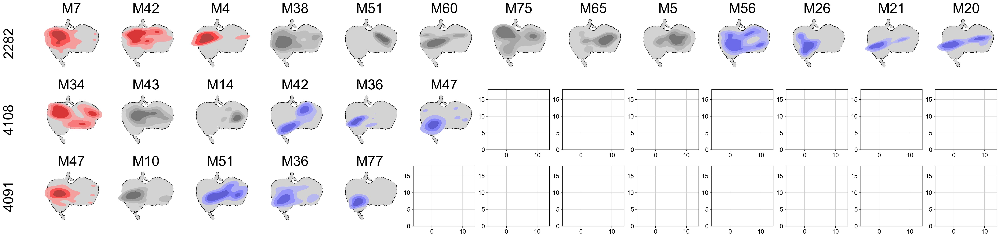

In [81]:
nrows = len(clone_order)
ncols = len(df[df.clone_id_aa==clone_order[0]].mouse.unique().tolist())

#plotting params
x_all = adata.obsm['X_umap'][:, 0]
y_all = adata.obsm['X_umap'][:, 1]
xmin, xmax = x_all.min(), x_all.max()
ymin, ymax = y_all.min(), y_all.max()

fig, ax = plt.subplots(ncols = ncols, nrows = nrows, figsize = (3 * ncols, 3 * nrows), constrained_layout=True)

#row indexer
y = 0
for clone in clone_order:
    #subset dataframe for ordering and scores
    mouse_list = df[df.clone_id_aa==clone].mouse.unique().tolist()
    #filter for mouse and clone
    df_subset = df[np.logical_and(df.mouse.isin(mouse_list), df.clone_id_aa==clone)].copy()
    #sort dataframe from highest effector score to unbiased to highest memory score
    df_subset['sorted_score'] = df_subset.TE_over_MP.tolist()
    df_subset.sorted_score[df_subset.bias == 'mem'] = df_subset[df_subset.bias == 'mem'].MP_over_TE * (-1)
    df_subset = df_subset.sort_values(by='sorted_score', ascending = False).copy()
    #sorted data
    sorted_m = df_subset.mouse.tolist()
    sorted_bias = df_subset.bias.tolist()

    #start plotting
    # col indexer
    x = 0
    for mouse, bias in zip(sorted_m, sorted_bias):
        # Plot background distribution of cells in silver
        sc.pl.umap(
            adata,
            color='leiden',
            add_outline=True, outline_width=(0.2, 0), outline_color=('black', 'white'),
            s=50,
            show=False,
            ax=ax[y,x],
            frameon=False,
            palette=['lightgray'],
            legend_loc=None
        )
    
        # Extract UMAP coordinates for the subset (clone 'x')
        subset = adata[np.logical_and(adata.obs.clone_id_aa == clone, adata.obs.mouse == mouse)]
        umap_coords = subset.obsm['X_umap']  
        # adjust plotting parameters    
        if bias == 'eff':
            c = 'maroon'
        elif bias == 'unbiased':
            c = 'black'
        else:
            c = 'navy'
        clone_size = df_subset[np.logical_and(df_subset.mouse == mouse, df_subset.bias == bias)].clone_id_aa_size_mouse.values[0]
        if clone_size < 20:
                kde_thresh = 0.4
                levels = 4
        else:
                kde_thresh = 0.2
                levels = 4
        #plot density
        sns.kdeplot(
            x=umap_coords[:, 0],
            y=umap_coords[:, 1],
            ax=ax[y,x],
            fill=True,
            color=c,
            #cmap=cmap,
            bw_adjust = 0.8,
            alpha= 0.9,  # Adjust transparency if needed
            levels = levels,
            thresh = kde_thresh,
            linewidths = 5,
            clip_on = False
        )
        #adjust colum for new donor and set title
        ax[y,x].set_title('M' + mouse[1:], fontsize = 32, loc='center', y=1.0, pad=-0);
        x = x+1
    #adjust row for new clone
    y = y+1

for ax_ in fig.axes:
    ax_.set_xlim(-6, 14)
    ax_.set_ylim(0, 18)
    
fig.canvas.draw()
fig.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

for i in range(nrows):
    # Get the bounding box of the leftmost axis in this row (in figure coordinates)
    bbox = ax[i, 0].get_position()
    # Calculate the vertical center of this axis
    y_center = (bbox.y0 + bbox.y1) / 2
    # Place text slightly to the left of the axis; adjust the x-offset as needed
    fig.text(bbox.x0 - 0.02, y_center, clone_order[i],
             va='center', ha='right', fontsize=32, rotation='vertical')


fig.savefig(save_figure_sc + 'selected_kdp_umaps_sel_clones_all_clusters.eps')


In [82]:
df.to_excel('df_after_final_plotting_all_clones.xlsx')
df[df.clone_id_aa.isin(clone_order)].to_excel('df_after_final_plotting_selected_clones.xlsx')

Get leiden distribution for selected plots

In [83]:
#### adjusted stacked barplot for frequency plotting:
def get_color(adata, obs, value):
    color = adata.uns[f"{obs}_colors"][
        sorted(adata.obs[obs].unique().tolist()).index(value)
    ]
    return color

def plot_frequencies(
    adata,
    groupby,
    subgrouping=None,
    subgroup_order=None,
    normalize=True,
    stacked=True,
    order=None,
    kind='bar',
    bbox_to_anchor=(1, 0.5),
    celltype_cat='celltype',
    celltypes_to_plot=None,    # ← now None by default
    celltype_order=None,       # ← new: explicit stacking order
    colors=None,               # ← now None by default
    return_df=False,
    ax=None,                   # ← now None, not string
    figsize=(10, 5),
    legend_columns=1
):
    """Plot frequencies of an observable in a stacked bar chart,
    with optional subgrouping and full control over category order.

    Parameters
    ----------
    adata : AnnData
    groupby : str
    subgrouping : str or None
    subgroup_order : list-like or None
    normalize : bool
    stacked : bool
    order : list-like or None
    kind : str
    bbox_to_anchor : tuple
    celltype_cat : str
    celltypes_to_plot : list-like or None
        If provided, restrict to these categories.
    celltype_order : list-like or None
        If provided, plot stacks in this exact bottom→top order.
    colors : list-like or None
    return_df : bool
    ax : matplotlib Axes or None
    figsize : tuple
    legend_columns : int

    Returns
    -------
    matplotlib.axes.Axes or DataFrame (if return_df=True)
    """
    remove_ax = False

    # determine subgroup order if not given
    if subgroup_order is None and subgrouping is not None:
        subgroup_order = adata.obs[subgrouping].unique().tolist()

    # split into subgrouped AnnData objects
    if subgrouping is not None:
        subgroups = [adata[adata.obs[subgrouping] == x].copy()
                     for x in subgroup_order]
    else:
        subgroups = [adata.copy()]
        subgroup_order = ['all cells']

    # set up axes
    if ax is None:
        fig, ax_list = plt.subplots(
            ncols=len(subgroups) + 1, figsize=figsize, sharey=True
        )
        ax = list(ax_list)
        remove_ax = True
    else:
        if len(subgroups) > 1:
            # inset multiple axes into the supplied ax
            ax_list = []
            n = len(subgroups)
            for i in range(n):
                ax_list.append(
                    inset_axes(
                        ax,
                        height="100%",
                        width=f"{int(1/n*100)}%",
                        bbox_to_anchor=(i*(1/n), 0, 0.8, 1),
                        bbox_transform=ax.transAxes
                    )
                )
            ax.remove()
            ax = ax_list
        else:
            ax = [ax]

    final_colors = []

    # loop over each subgroup
    for data, axes, group in zip(subgroups, ax, subgroup_order):
        # decide which cell-types to plot and in what order
        if celltype_order is not None:
            # keep only those in data, in the order given
            celltypes_plot = [
                ct for ct in celltype_order
                if ct in data.obs[celltype_cat].unique()
            ]
        else:
            if celltypes_to_plot:
                # intersection, then sort
                celltypes_plot = sorted(
                    set(celltypes_to_plot) &
                    set(data.obs[celltype_cat].unique())
                )
            else:
                celltypes_plot = sorted(data.obs[celltype_cat].unique())

        # fetch colors if not manually provided
        if colors is None and f"{celltype_cat}_colors" in data.uns:
            final_colors = [
                get_color(data, celltype_cat, ct)
                for ct in celltypes_plot
            ]
        else:
            final_colors = colors

        # build the counts DataFrame
        samples = data.obs[groupby].unique().tolist()
        df = pd.DataFrame()
        for samplename in samples:
            vc = data[data.obs[groupby] == samplename].obs[celltype_cat].value_counts()
            df[samplename] = vc

        # normalize if requested
        if normalize:
            df = df.div(df.sum(axis=0), axis=1)

        # enforce sample order if given
        if order is not None:
            df = df[order]

        # actually plot
        plot_kwargs = dict(
            kind=kind,
            stacked=stacked,
            title=group,
            grid=False,
            ax=axes,
            width=0.8
        )
        if final_colors:
            plot_kwargs['color'] = final_colors

        df.T[celltypes_plot].plot(**plot_kwargs)
        axes.legend(loc='center left',
                    bbox_to_anchor=bbox_to_anchor,
                    ncol=legend_columns)

    # clean up any extra axes/legends
    if len(subgroups) > 1:
        for a in ax[:-2]:
            a.get_legend().remove()
        ax[-1].remove()
    elif remove_ax:
        ax[-1].remove()

    if return_df:
        return df
    else:
        return ax if len(ax) > 1 else ax[0]

In [84]:
df_mouse = pd.DataFrame(adata.obs.mouse.unique()).sort_values(by=0)
ordered_m_list = df_mouse[0].tolist()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


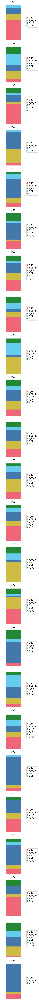

In [85]:
m_list_comp = []
for clone in clone_order:
    mlist = df[df.clone_id_aa==clone].mouse.tolist()
    m_list_comp.append(mlist)
    
# master list
plotting_order = ['0_TE', '2_MP', '1_EE_like', '3_CE', '4_IE_like', '5_na1', '6_na2']

total = sum(len(sub) for sub in m_list_comp)

#get figure
fig, ax = plt.subplots(nrows = total, figsize = (4, 4*total))

ax_count = 0
for i, clone in enumerate (clone_order):
    adata_clone = adata[adata.obs.clone_id_aa==clone].copy()
    for mouse in m_list_comp[i]:
        adata_mouse = adata_clone[adata_clone.obs.mouse==mouse].copy()
        present = adata_mouse.obs['leiden'].cat.categories.tolist()  
        subset_order = [ct for ct in plotting_order if ct in present]
        plot_frequencies(adata_mouse, groupby='mouse', celltype_cat='leiden', colors = leiden_dict, ax = ax[ax_count])
        ax[ax_count].set_title(mouse)
        ax[ax_count].set_axis_off()
        ax_count = ax_count + 1
        
fig.tight_layout()
fig.savefig(save_figure_sc + 'selected_leiden_stacked_sel_clones_all_clusters.eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


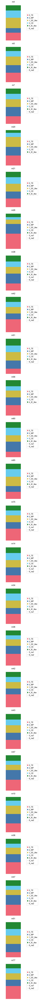

In [86]:
m_list_comp = []
for clone in clone_order:
    mlist = df[df.clone_id_aa==clone].mouse.tolist()
    m_list_comp.append(mlist)
    
# master list
plotting_order = ['0_TE', '2_MP', '1_EE_like', '3_CE', '4_IE_like', '5_na1', '6_na2']

total = sum(len(sub) for sub in m_list_comp)

#get figure
fig, ax = plt.subplots(nrows = total, figsize = (4, 4*total))

ax_count = 0
for i, clone in enumerate (clone_order):
    for mouse in m_list_comp[i]:
        adata_mouse = adata[adata.obs.mouse==mouse].copy()
        present = adata_mouse.obs['leiden'].cat.categories.tolist()  
        subset_order = [ct for ct in plotting_order if ct in present]
        plot_frequencies(adata_mouse, groupby='mouse', celltype_cat='leiden', colors = leiden_dict, ax = ax[ax_count], celltype_order = subset_order)
        ax[ax_count].set_title(mouse)
        ax[ax_count].set_axis_off()
        ax_count = ax_count + 1
        
fig.tight_layout()
fig.savefig(save_figure_sc + 'selected_leiden_stacked_whole_mouse_all_clusters.eps')

In [87]:
obs_list = ['clone_id_aa','shared_mouse','clone_id_aa_size_mouse','norm_clone_id_aa_size_mouse_2','norm_clone_id_aa_size_mouse',
            'clone_id_aa_rank','TE_ES','MP_ES','MP_over_TE','TE_over_MP','bias']

In [88]:
df = pd.DataFrame(adata.obs[obs_list])
df.to_excel('./IMMUNITY_obs_df.xlsx')

### Add outliers

In [89]:
df = adata_sub.obs.groupby(['clone_id_aa', 'mouse']).agg(
    shared_mouse = ('shared_mouse', 'first'),
    clone_id_aa_size_mouse=('clone_id_aa_size_mouse', 'first'),
    norm_clone_id_aa_size_mouse=('norm_clone_id_aa_size_mouse_2', 'first'),
    clone_id_aa_rank=('clone_id_aa_rank', 'first'),
    TE_ES=('TE_ES', 'first'),
    MP_ES=('MP_ES', 'first'),
    MP_over_TE=('MP_over_TE', 'first'),
    TE_over_MP=('TE_over_MP', 'first'),
    bias=('bias', 'first'),
    
).reset_index()
df = df.dropna()

df = df[df.bias!='not_assigned'].reset_index(drop=True).copy()

### select only top 3 clones for faster plotting
clone_order = order[:3].tolist()

In [90]:
#df[df.clone_id_aa==clone_order[0]]

2282
2282
2282
2282
2282
2282
2282
2282
2282
2282
2282
2282
2282
4108
4108
4108
4108
4108
4108
4091
4091
4091
4091
4091


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


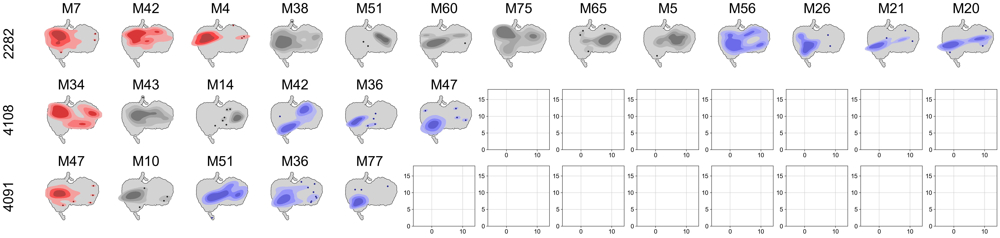

In [91]:
from scipy.stats import gaussian_kde

nrows = len(clone_order)
ncols = len(df[df.clone_id_aa==clone_order[0]].mouse.unique().tolist())

#plotting params
x_all = adata.obsm['X_umap'][:, 0]
y_all = adata.obsm['X_umap'][:, 1]
xmin, xmax = x_all.min(), x_all.max()
ymin, ymax = y_all.min(), y_all.max()

fig, ax = plt.subplots(ncols = ncols, nrows = nrows, figsize = (3 * ncols, 3 * nrows), constrained_layout=True)

#row indexer
y = 0
for clone in clone_order:
    #subset dataframe for ordering and scores
    mouse_list = df[df.clone_id_aa==clone].mouse.unique().tolist()
    #filter for mouse and clone
    df_subset = df[np.logical_and(df.mouse.isin(mouse_list), df.clone_id_aa==clone)].copy()
    #sort dataframe from highest effector score to unbiased to highest memory score
    df_subset['sorted_score'] = df_subset.TE_over_MP.tolist()
    df_subset.sorted_score[df_subset.bias == 'mem'] = df_subset[df_subset.bias == 'mem'].MP_over_TE * (-1)
    df_subset = df_subset.sort_values(by='sorted_score', ascending = False).copy()
    #sorted data
    sorted_m = df_subset.mouse.tolist()
    sorted_bias = df_subset.bias.tolist()

    #start plotting
    # col indexer
    x = 0
    for mouse, bias in zip(sorted_m, sorted_bias):
        # Plot background distribution of cells in silver
        sc.pl.umap(
            adata,
            color='leiden',
            add_outline=True, outline_width=(0.2, 0), outline_color=('black', 'white'),
            s=50,
            show=False,
            ax=ax[y,x],
            frameon=False,
            palette=['lightgray'],
            legend_loc=None
        )
    
        # Extract UMAP coordinates for the subset (clone 'x')
        subset = adata[np.logical_and(adata.obs.clone_id_aa == clone, adata.obs.mouse == mouse)]
        umap_coords = subset.obsm['X_umap']  
            
        if bias == 'eff':
            c = 'maroon'
        elif bias == 'unbiased':
            c = 'black'
        else:
            c = 'navy'

        #get clone size in mouse to adjust threshold
        clone_size = df_subset[np.logical_and(df_subset.mouse == mouse, df_subset.bias == bias)].clone_id_aa_size_mouse.values[0]
        if clone_size < 20:
                kde_thresh = 0.4
                levels = 4
        else:
                kde_thresh = 0.2
                levels = 4
        #plot density
        sns.kdeplot(
            x=umap_coords[:, 0],
            y=umap_coords[:, 1],
            ax=ax[y,x],
            fill=True,
            color=c,
            #cmap=cmap,
            bw_adjust = 0.8,
            alpha= 0.9,  # Adjust transparency if needed
            levels = levels,
            thresh = kde_thresh,
            linewidths = 5,
            clip_on = False
        )

######### add outliers
        # 1. Stack points for gaussian_kde
        xy = np.vstack([umap_coords[:, 0], umap_coords[:, 1]])
        
        # 2. Fit & evaluate
        kde_model = gaussian_kde(xy, bw_method=0.8)
        densities = kde_model(xy)
        
        # 3. Compute the absolute density cutoff
        #    Seaborn’s `thresh` is relative to the maximum density:
        density_cutoff = kde_thresh * densities.max()
        
        # 4. Mask and scatter the “outliers”
        outliers = densities < density_cutoff
        ax[y, x].scatter(
            umap_coords[outliers, 0],
            umap_coords[outliers, 1],
            s=20,               # dot size
            color=c,            # same color as the fill
            edgecolor='white',  # white halo for visibility
            linewidth=0.5,
            alpha=0.8,
            label='outlier'
        )

        
        #adjust colum for new donor and set title
        ax[y,x].set_title('M' + mouse[1:], fontsize = 32, loc='center', y=1.0, pad=-0);
        x = x+1

        print(clone)
    #adjust row for new clone
    y = y+1

for ax_ in fig.axes:
    ax_.set_xlim(-6, 14)
    ax_.set_ylim(0, 18)
    
fig.canvas.draw()
fig.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

for i in range(nrows):
    # Get the bounding box of the leftmost axis in this row (in figure coordinates)
    bbox = ax[i, 0].get_position()
    # Calculate the vertical center of this axis
    y_center = (bbox.y0 + bbox.y1) / 2
    # Place text slightly to the left of the axis; adjust the x-offset as needed
    fig.text(bbox.x0 - 0.02, y_center, clone_order[i],
             va='center', ha='right', fontsize=32, rotation='vertical')


fig.savefig(save_figure_sc + 'selected_kdp_umaps_sel_clones_all_clusters_w_outliers.eps')
